# Anomaly detection - Julien DELAVANDE

## `Problem Formulation`

The goal is to develop an algorithm capable of detecting abnormal windows in a dataset from an aircraft system. The data includes 11 recorded parameters (such as speed, temperature, pressure, etc.), with measurements organized into windows that can contain up to 100 points.

### Feasibility:

1. **Statistical Anomaly Detection**: Employ statistical methods to identify behaviors significantly deviating from the norm, such as extreme values or unusual patterns in the data.
2. **Machine Learning Models**: Implement machine learning techniques like isolation forests or autoencoders to learn normal patterns and detect anomalies.
3. **Temporal Analysis**: Analyze the data considering temporal sequences, which is crucial for identifying anomalies in specific windows.

### Limitations and Challenges:

1. **Lack of Labeled Data**: If the data is unlabeled (i.e., no clear indication of what constitutes an anomaly), training supervised models can be challenging.
2. **Complexity of Multidimensional Data**: Managing and analyzing multidimensional data can be complex, especially when detecting subtle relationships or interactions among various parameters.
3. **Definition of Anomaly**: Without a clear and operational definition of what constitutes an anomaly in this specific context, calibrating the algorithm appropriately can be difficult.

In summary, the task is achievable using statistical and machine learning techniques, but it presents certain challenges related to the nature of the data and the potential absence of clear labels for model training.

### Discussion on what is an anomaly in our context

In the context of aviation, an anomaly can be defined as a significant deviation from the normal or expected operational patterns of an aircraft's systems. These deviations could result from changes in environmental conditions, mechanical errors, human errors, or other unforeseen factors that impact the aircraft's performance and safety.

**Definition of Anomaly**:
An anomaly is an observation or a sequence of observations that significantly diverge from the usual operational trends, as measured by standard flight parameters (such as speed, altitude, temperature, pressure, etc.) and aircraft system performance indicators. Anomalies may manifest as:

1. **Extreme Values**: Readings that fall outside established operational thresholds.
2. **Abrupt Changes**: Rapid transitions or jumps in readings that are not characteristic of normal operational changes.
3. **Unusual Trends**: Patterns or trends in the data that do not match historical or expected profiles.
4. **Abnormal Correlations**: Changes in known relationships between parameters that could indicate underlying malfunctions.

In summary, for an anomaly definition to be useful in aviation, it must be sensitive to both punctual events and gradual changes in data. Data processing and analysis need to be designed to capture this duality, enabling early and accurate detection of conditions that could compromise aircraft safety or performance.

## `Data Exploration`

In the initial phase of the project, our focus is on understanding and preparing the dataset, a crucial step to ensure the reliability and effectiveness of the subsequent anomaly detection process.

### Data Description

The dataset, derived from an aircraft system, comprises 11 parameters, including speed, temperature, and pressure, segmented into windows with up to 100 data points each.

In [75]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [181]:
data = pd.read_csv('data/dataset.csv')
data

,day_cycle_window,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11
0,1_1_1,-0.805191,-1.141993,-1.328327,-1.516693,-1.373962,-0.808270,-1.070547,-0.504352,2.807146,0.495528,-1.246737
1,1_1_1,-0.805191,-1.134902,-1.320393,-1.505848,-1.361560,-0.807840,-1.064212,-0.516000,2.894177,0.494467,-1.244472
2,1_1_1,-0.805191,-1.117304,-1.307167,-1.505848,-1.361560,-0.807840,-1.064212,-0.516000,2.981904,0.429370,-1.244472
3,1_1_1,-0.814231,-1.114206,-1.287593,-1.442302,-1.287565,-0.807840,-1.045557,-0.516000,3.063298,0.348056,-1.244472
4,1_1_1,-0.848104,-1.112276,-1.285393,-1.429076,-1.270722,-0.807840,-1.017575,-0.664906,3.049237,0.118828,-1.270237
...,...,...,...,...,...,...,...,...,...,...,...,...
162697,4_4_160,0.147741,0.060913,0.185874,-0.163053,-0.284814,0.150407,0.029841,0.111318,-1.663704,0.614371,0.432218
162698,4_4_160,0.147741,0.060913,0.185874,-0.163053,-0.284814,0.177867,0.029841,0.113368,-1.663704,0.614371,0.432218
162699,4_4_160,0.147741,0.060913,0.185874,-0.163053,-0.284814,0.179901,0.029841,0.113368,-1.663704,0.614371,0.432218
162700,4_4_160,0.147741,0.060913,0.185874,-0.163053,-0.232045,0.179901,0.029841,0.113368,-1.663704,0.614371,0.432218


In [77]:
data.describe()

,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11
count,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000
mean,0.000009,0.000011,0.000031,0.000005,0.000016,-0.000005,-0.000002,0.000003,-0.000021,0.000026,0.000030
std,0.999950,0.999925,0.999961,0.999925,0.999963,0.999926,0.999950,0.999949,0.997770,0.999686,0.999847
min,-3.211980,-3.395387,-3.325651,-3.378450,-3.281286,-4.200181,-3.898025,-3.524957,-13.704556,-12.044778,-3.183571
25%,-0.678808,-0.482716,-0.629123,-0.491585,-0.612334,-0.559023,-0.606135,-0.736398,-0.593096,-0.498480,-0.658530
50%,0.041883,0.180361,0.041442,0.147397,0.117040,0.153972,0.186038,-0.012354,-0.034882,-0.257635,-0.015437
75%,0.743973,0.656920,0.659246,0.636887,0.712393,0.685353,0.718237,0.802395,0.508232,0.359773,0.636740
max,5.013899,6.260782,8.652950,8.359670,6.424227,5.638259,3.735957,4.667058,8.203706,5.597387,9.204384


Each feature has a mean of about zero and a standard deviation of about one. Hence the data is already normalized.

In [78]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162702 entries, 0 to 162701
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   day_cycle_window  162702 non-null  object 
 1   p1                162702 non-null  float64
 2   p2                162702 non-null  float64
 3   p3                162702 non-null  float64
 4   p4                162702 non-null  float64
 5   p5                162702 non-null  float64
 6   p6                162702 non-null  float64
 7   p7                162702 non-null  float64
 8   p8                162702 non-null  float64
 9   p9                162702 non-null  float64
 10  p10               162702 non-null  float64
 11  p11               162702 non-null  float64
dtypes: float64(11), object(1)
memory usage: 14.9+ MB


There is no missing data in the dataset. All data are numericalS except the column 0 which is the day_cycle_window index. For easier operation, we will convert the day_cycle_window index into three columns: day, cycle, and window:

In [183]:
data[['Day', 'Cycle', "Window"]] = data['day_cycle_window'].str.split('_', expand=True).astype(int)
data

,day_cycle_window,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,Day,Cycle,Window
0,1_1_1,-0.805191,-1.141993,-1.328327,-1.516693,-1.373962,-0.808270,-1.070547,-0.504352,2.807146,0.495528,-1.246737,1,1,1
1,1_1_1,-0.805191,-1.134902,-1.320393,-1.505848,-1.361560,-0.807840,-1.064212,-0.516000,2.894177,0.494467,-1.244472,1,1,1
2,1_1_1,-0.805191,-1.117304,-1.307167,-1.505848,-1.361560,-0.807840,-1.064212,-0.516000,2.981904,0.429370,-1.244472,1,1,1
3,1_1_1,-0.814231,-1.114206,-1.287593,-1.442302,-1.287565,-0.807840,-1.045557,-0.516000,3.063298,0.348056,-1.244472,1,1,1
4,1_1_1,-0.848104,-1.112276,-1.285393,-1.429076,-1.270722,-0.807840,-1.017575,-0.664906,3.049237,0.118828,-1.270237,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162697,4_4_160,0.147741,0.060913,0.185874,-0.163053,-0.284814,0.150407,0.029841,0.111318,-1.663704,0.614371,0.432218,4,4,160
162698,4_4_160,0.147741,0.060913,0.185874,-0.163053,-0.284814,0.177867,0.029841,0.113368,-1.663704,0.614371,0.432218,4,4,160
162699,4_4_160,0.147741,0.060913,0.185874,-0.163053,-0.284814,0.179901,0.029841,0.113368,-1.663704,0.614371,0.432218,4,4,160
162700,4_4_160,0.147741,0.060913,0.185874,-0.163053,-0.232045,0.179901,0.029841,0.113368,-1.663704,0.614371,0.432218,4,4,160


In [184]:
data = data[['p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'Day', 'Cycle', 'Window', 'day_cycle_window']]

### Data Distribution

#### Boxplot

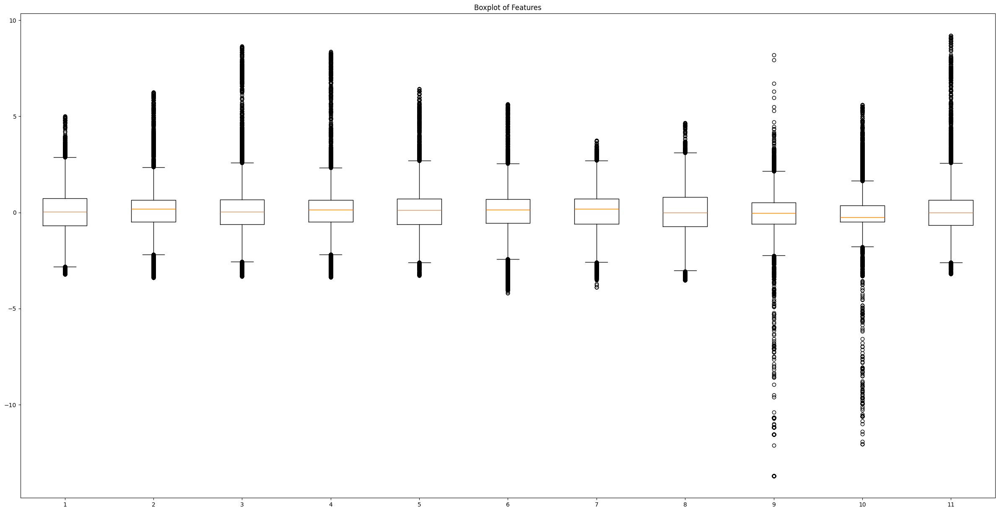

In [81]:
# boxplot

plt.figure(figsize=(30, 15))

plt.boxplot([data.iloc[:, i] for i in range(0, 11)])
plt.title("Boxplot of Features")
plt.show()


Boxplots are a highly informative visualization for assessing the spread and central tendency of the data, as well as for spotting outliers. The boxplot for each feature here provides a visual summary of the median, quartiles, and outliers, offering a concise snapshot of the distribution.

Observations from the boxplots include:

- **Median and Quartiles**: Most features have medians near zero, suggesting that the data may already be centered or standardized. The interquartile ranges (the boxes) vary in size, indicating different levels of variability among the features.

- **Outliers**: The presence of points beyond the whiskers in nearly all features indicates potential outliers. These are data points that fall outside the typical range (1.5 times the interquartile range from the quartiles) and may signify anomalous behavior.

- **Symmetry**: For many features, the boxplots are symmetric about the median, but some show asymmetry, with longer whiskers in one direction. This asymmetry can inform about the skewness of the data.

- **Feature Variation**: There is a noticeable variation in the spread of data across features. Some features have tightly packed quartiles indicating less variability, while others have more spread out quartiles, showing greater variability.

- **Extreme Values**: Some features have extreme values that are several magnitudes away from the central box, especially evident in features 9 and 11. These extreme values could be critical in understanding the extreme operating conditions of the aircraft systems.

The boxplots underscore the need for a tailored approach when dealing with each feature, as they present unique distributions and potential anomalies. These visualizations will guide the anomaly detection process by highlighting which features may require more attention due to their variability and outlier presence.

#### Histograms

The histograms provide a fundamental insight into the distribution of each feature within our dataset, which is integral to the initial exploratory data analysis phase. By visualizing the data in this manner, we gain a deeper understanding of the underlying structure, detect potential irregularities, and assess the normality of the data distribution. This analysis is particularly relevant as it helps in identifying features with skewed distributions, potential outliers, and the presence of multimodal patterns, which can be indicative of complex underlying dynamics or anomalies in the aircraft system's behavior.

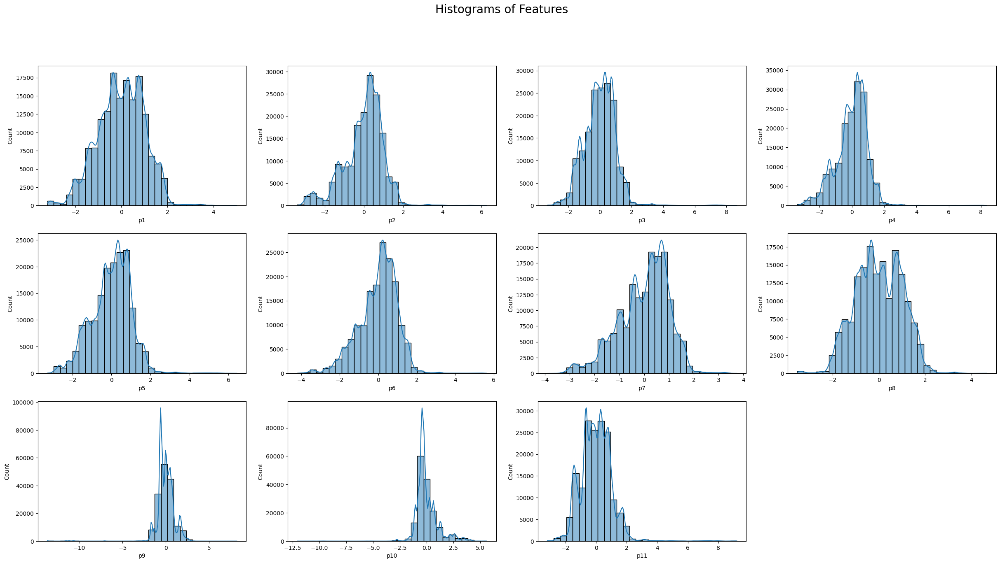

In [82]:
plt.figure(figsize=(30, 15))

plt.suptitle('Histograms of Features', fontsize=20)

for i in range(0,11):
    plt.subplot(3, 4, i+1)
    sns.histplot(data.iloc[:, i], bins=30, kde=True)

plt.show()


Upon inspecting the histograms for each feature, several observations can be made:

- **Symmetry and Skewness**: Most features exhibit a bell-shaped distribution, suggesting a symmetric distribution around the mean. However, certain features show a slight skew, either to the left or right, which could indicate systematic biases in the data or the presence of outliers.

- **Peakedness (Kurtosis)**: The distributions vary in peakedness, with some features showing sharp peaks while others are more flattened. Sharp peaks may suggest that the data is heavily concentrated around the mean, whereas flatter distributions indicate more variability.

- **Multimodal Distributions**: Some features show multiple peaks (bimodal or trimodal patterns), which may reflect different operating modes or conditions within the aircraft system. Identifying the cause of these distinct modes can be crucial for understanding system behavior.

- **Outliers**: The presence of data points that extend far beyond the main body of the distribution could represent outliers. It is essential to investigate these further as they could either be anomalies or errors in the data collection process.

- **Consistency Across Features**: While some features have similar distribution shapes, others differ significantly. This variation underscores the importance of analyzing each feature individually and collectively to understand their interactions and contributions to system performance.

The insights gathered from this histogram analysis lay the groundwork for more sophisticated data processing and anomaly detection techniques, allowing for a data-driven approach to maintaining aircraft safety and performance.

#### Time Series/Line Plots

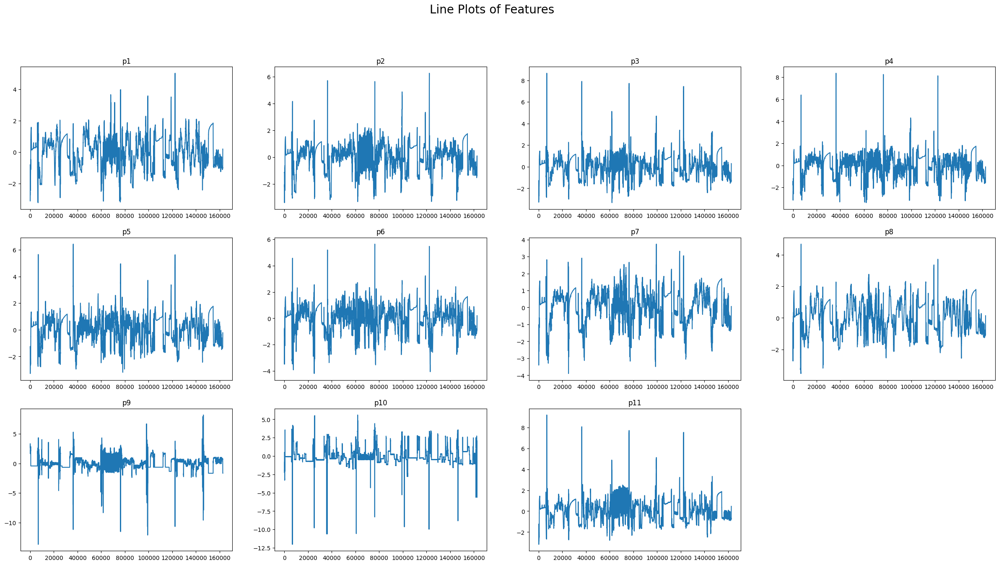

In [83]:
plt.figure(figsize=(30, 15))

plt.suptitle('Line Plots of Features', fontsize=20)

for i in range(0,11):
    plt.subplot(3, 4, i+1)
    plt.plot(data.iloc[:, i])
    plt.title(data.columns[i])

plt.show()


Line plots of the features over time are instrumental in understanding the temporal dynamics and stability of a system. They reveal trends, cyclic patterns, anomalies, and noise in data.

From the line plots provided:

- **Trends**: There do not appear to be long-term increasing or decreasing trends in any of the features, which suggests stable mean levels over the period represented.

- **Volatility**: The plots show varying degrees of volatility among the features. Some features exhibit relatively calm periods interspersed with spikes, while others show more constant fluctuations.

- **Spikes**: Sharp spikes in the data could represent transient anomalies or sensor errors. The context of the spikes is critical; if they correspond to known events, they may be normal. Otherwise, they could be indicative of system issues.

- **Periodicity**: There's no immediately apparent periodic behavior that would indicate regular, cyclic patterns. However, more sophisticated time series analysis could uncover less obvious cycles.

- **Noise**: The features exhibit a level of noise, which is normal in real-world data. The challenge is to distinguish between noise and true anomalies.

These visualizations are vital for the next steps in the analysis, which may include filtering to reduce noise, feature engineering to better capture the dynamics, and applying time series analysis techniques to identify and predict anomalies.

### Data correlation

The correlation heatmap is a powerful tool for understanding the relationships between different features in a dataset. In the context of aircraft systems, understanding these correlations can help in identifying features that move together, which may be indicative of underlying physical processes or system behaviors.

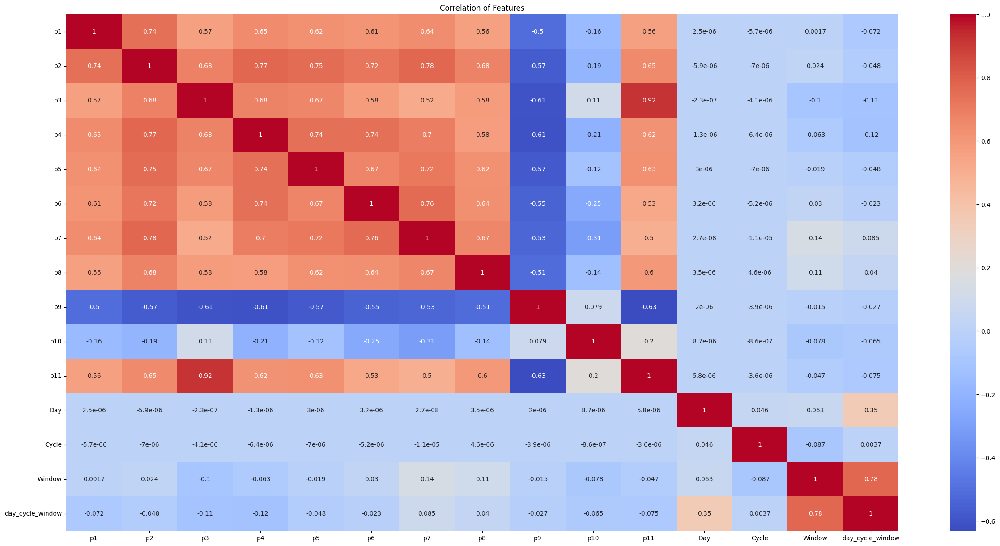

In [84]:
plt.figure(figsize=(30, 15))

sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation of Features")
plt.show()

Looking at the heatmap provided:

- **Strong Positive Correlation**: Red hues indicate a strong positive correlation, where higher values of one feature are associated with higher values of another. Several pairs of features show high positive correlation, which suggests they may be influenced by similar factors or conditions within the aircraft system.

- **Negative Correlation**: Blue hues indicate a negative correlation, where higher values of one feature are associated with lower values of another. The features showing negative correlations might represent inverse relationships in the system's dynamics.

- **No Correlation to Weak Correlation**: Lighter colors represent no to weak correlation. Features with weak correlations may operate independently within the system, or the relationship may not be linear and could require more complex models to understand.

- **Day, Cycle, and Window**: The 'Day', 'Cycle', and 'Window' features show very low correlation with the sensor readings, which might be expected as these are likely categorical or indexing features rather than measurements.

This heatmap can inform feature selection for predictive modeling, as highly correlated features might carry redundant information. Additionally, understanding these relationships is crucial for diagnosing potential issues in the aircraft system and ensuring its proper functioning.

In unsupervised anomaly detection, we delve into the multivariate nature of data, seeking patterns that deviate from the established norm. A correlation matrix is a pivotal tool in this quest, as it does not merely highlight anomalies in individual values but illuminates the intricate web of relationships between multiple variables. Anomalies can manifest as changes in these correlations, disrupting the usual synchrony in data behavior. This disruption can be subtle, such as a slight decrease in the correlation coefficient between two variables that typically move in tandem. It's these nuanced shifts that often signal the emergence of anomalous conditions, providing an early warning system for potential issues within complex systems like aircraft operations. By including a correlation matrix in our analysis, we equip ourselves to detect not just the outliers, but also to understand the broader anomaly landscape in a multidimensional context.

#### PCA

The variance explained by each principal component in a PCA provides valuable insight into how much of the total dataset's variability is captured by those components. In the context of anomaly detection for aircraft systems, this information is particularly pertinent.

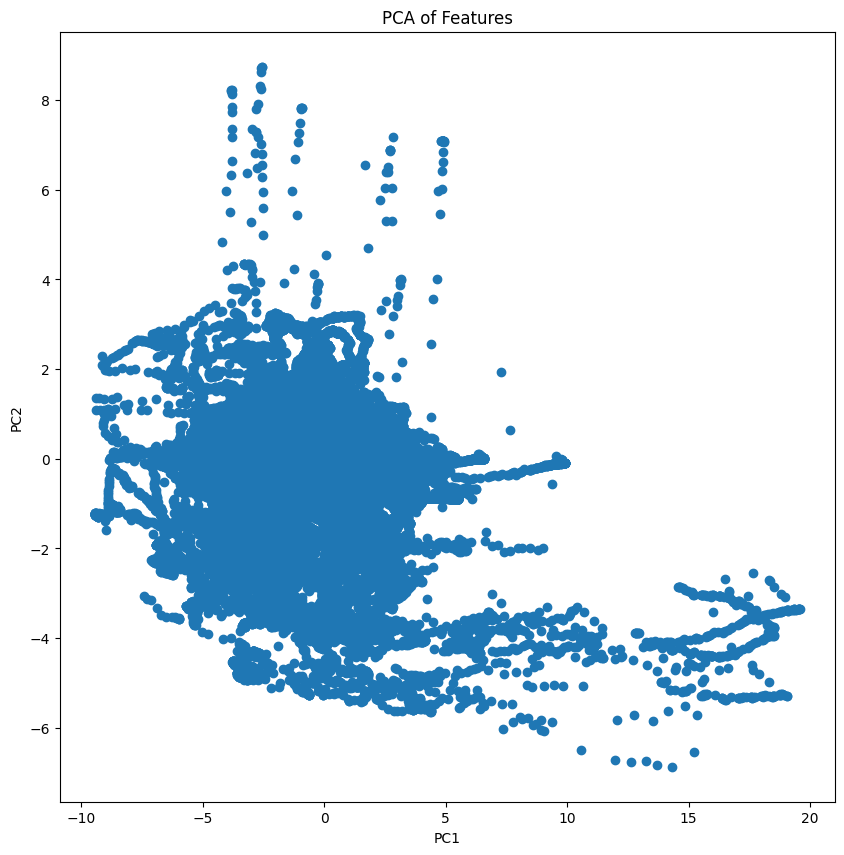

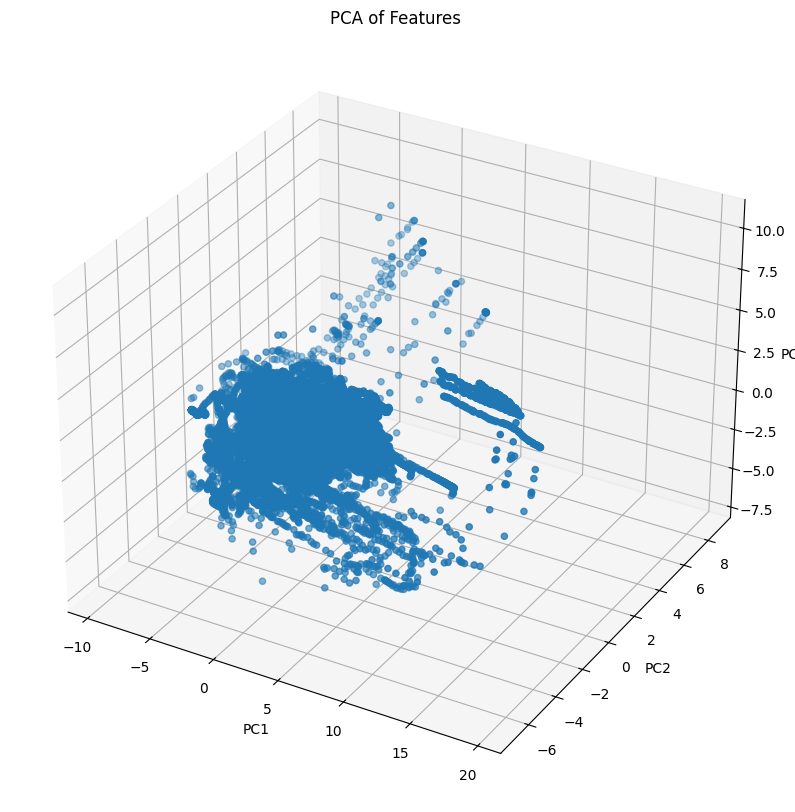

variance explained : [0.61708616 0.12582397 0.05040478 0.04261311 0.03774242 0.0362675
 0.02856998 0.0212243  0.01927004 0.01477259 0.00622515]


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11
0,0.302117,0.345238,0.314715,0.333049,0.328146,0.319956,0.320903,0.299772,-0.280957,-0.063966,0.306019
1,0.072915,0.077563,-0.355021,0.074922,0.006342,0.178376,0.257166,0.032781,0.111432,-0.751194,-0.425719
2,-0.261962,-0.198318,0.141452,0.113423,-0.101650,-0.082552,-0.203778,-0.276354,-0.747863,-0.385991,0.125859
3,0.519656,0.158607,0.071777,0.278836,0.077933,-0.104691,-0.151615,-0.746269,0.156485,-0.017237,-0.013264
4,0.568013,0.068601,0.095082,-0.342838,-0.357242,-0.374794,-0.209196,0.340914,-0.053098,-0.281216,0.189993
5,0.357508,-0.011813,-0.484775,-0.139186,-0.019413,0.043098,0.190776,-0.018763,-0.551426,0.419477,-0.314095
6,0.092277,-0.094028,0.080460,0.060389,-0.697973,0.681098,-0.035016,-0.078796,0.052421,0.070340,0.079569
7,-0.109878,0.143128,0.165232,-0.564597,-0.086692,-0.052223,0.647763,-0.378308,-0.006796,-0.059215,0.211804
8,0.246689,-0.522944,0.101646,-0.438620,0.486919,0.408349,-0.204549,-0.049873,0.031598,-0.110614,0.039418
9,0.174449,-0.707523,0.012253,0.374440,-0.107904,-0.260237,0.466269,0.060263,0.096667,0.011749,0.136878


In [85]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data.iloc[:, 0:11])

pca = PCA(n_components=11)
data_pca = pca.fit_transform(data_scaled)

plt.figure(figsize=(10, 10))
plt.scatter(data_pca[:, 0], data_pca[:, 1])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA of Features')
plt.show()

#display 3d plot    
plt.figure(figsize=(10, 10))
ax = plt.axes(projection='3d')
ax.scatter3D(data_pca[:, 0], data_pca[:, 1], data_pca[:, 2])
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.title('PCA of Features')
plt.show()

weights = pd.DataFrame(pca.components_, columns=data.columns[0:11])
print(f"variance explained : {pca.explained_variance_ratio_}")
weights


PC1 and PC2 Analysis: The first two components might be used to create a baseline "profile" of normal operational behavior. Data points that do not fit within this profile could be flagged for further investigation as potential anomalies.

Higher Components: The components that explain less variance are often where anomalies become more apparent. These components can sometimes capture the "noise" in the data, which in the case of anomaly detection, could actually be the signal (anomalies) we are interested in.

Cumulative Variance: Together, the first two components account for approximately 74% of the variance. Depending on the complexity of the aircraft systems and the subtlety of the anomalies, we may need to consider more components to capture enough of the system's behavior for effective anomaly detection.

In summary, while the first few components are vital for understanding the general trends and main operational characteristics, the less dominant components should not be disregarded, as they may hold the key to identifying anomalous behavior that could indicate potential issues within the aircraft systems. It's the interplay between the components that can provide a comprehensive picture for anomaly detection.

### Analysis over days and cycles

Analyzing data grouped by temporal units such as days or cycles offers a compelling insight into the behavioral patterns and operational dynamics that may vary over time. Such granularity enables us to discern daily or cyclical trends, uncovering rhythms and routines inherent to the system's performance. This approach is particularly advantageous in detecting anomalies that are not just standalone events but are contextual to the time of occurrence. It helps in identifying deviations that may be normal for one cycle but anomalous for another, thereby enhancing the precision of anomaly detection mechanisms. Moreover, grouping data allows us to control for time-based confounding factors, ensuring that the anomalies detected are genuine and not artifacts of periodic changes or seasonal effects. This methodical segmentation paves the way for a deeper understanding of the temporal aspects of the data, which is critical in crafting robust, time-aware anomaly detection models.

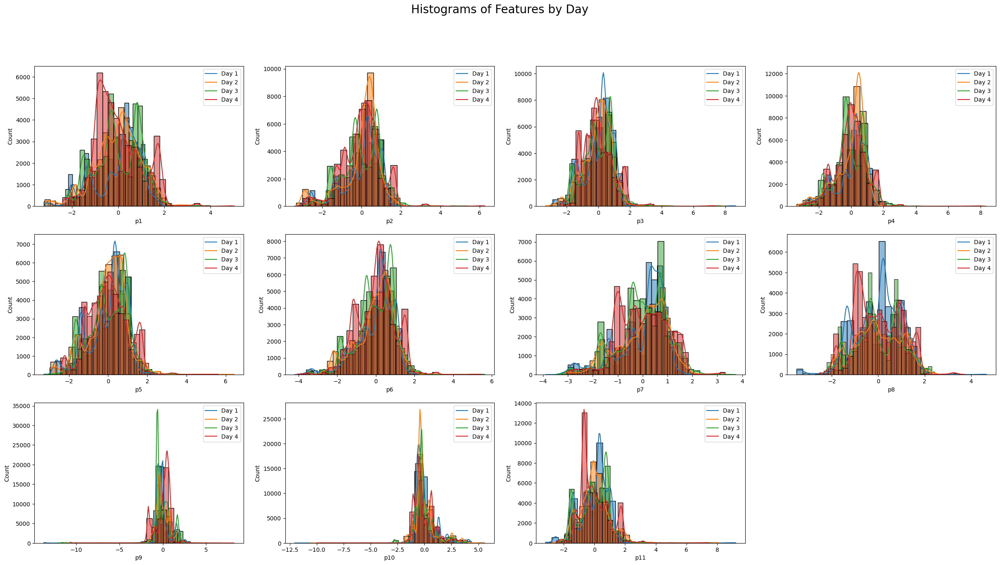

In [86]:
data_days = [data[data['Day'] == i] for i in range(1, 5)]

plt.figure(figsize=(30, 15))

plt.suptitle('Histograms of Features by Day', fontsize=20)

for i in range(0,11):
    plt.subplot(3, 4, i+1)
    sns.histplot(data_days[0].iloc[:, i], bins=30, kde=True)
    sns.histplot(data_days[1].iloc[:, i], bins=30, kde=True)
    sns.histplot(data_days[2].iloc[:, i], bins=30, kde=True)
    sns.histplot(data_days[3].iloc[:, i], bins=30, kde=True)
    plt.legend(['Day 1', 'Day 2', 'Day 3', 'Day 4'])


The histograms segmented by day provide us with a granular view of the data's behavior over different time periods. This kind of analysis is essential to understand the daily variability and to identify if the patterns observed are consistent or if there are deviations that could signify anomalies or changes in the system's performance.

When we look at the histograms for each feature across different days, we can observe the following:

- **Consistency Across Days**: Some features exhibit consistent distributions across different days, which could suggest stable system behavior during these periods.

- **Day-to-Day Variability**: There are evident changes in the distribution for some features across different days. These shifts could be due to natural variations in the system's operation or could indicate potential issues that warrant further investigation.

- **Presence of Outliers**: On certain days, some features show tails that extend far beyond the typical range of the data. These could be outliers that may represent anomalies.

- **Shifts in Central Tendency**: The central peak of the distributions for some features shifts between days. This could imply that the operating conditions or the system's performance is changing over time.

- **Multimodality**: The multimodal distributions observed in some features could be more pronounced on certain days, perhaps reflecting specific operational modes that are engaged intermittently.

These day-wise histograms underscore the importance of considering temporal factors in the analysis and highlight the need to understand the context behind each day's operation. The variability observed can serve as a basis for further investigation into what constitutes normal variation versus an anomaly.

In [88]:
data

,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,Day,Cycle,Window,day_cycle_window
0,-0.805191,-1.141993,-1.328327,-1.516693,-1.373962,-0.808270,-1.070547,-0.504352,2.807146,0.495528,-1.246737,1,1,1,1_1_1
1,-0.805191,-1.134902,-1.320393,-1.505848,-1.361560,-0.807840,-1.064212,-0.516000,2.894177,0.494467,-1.244472,1,1,1,1_1_1
2,-0.805191,-1.117304,-1.307167,-1.505848,-1.361560,-0.807840,-1.064212,-0.516000,2.981904,0.429370,-1.244472,1,1,1,1_1_1
3,-0.814231,-1.114206,-1.287593,-1.442302,-1.287565,-0.807840,-1.045557,-0.516000,3.063298,0.348056,-1.244472,1,1,1,1_1_1
4,-0.848104,-1.112276,-1.285393,-1.429076,-1.270722,-0.807840,-1.017575,-0.664906,3.049237,0.118828,-1.270237,1,1,1,1_1_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162697,0.147741,0.060913,0.185874,-0.163053,-0.284814,0.150407,0.029841,0.111318,-1.663704,0.614371,0.432218,4,4,160,4_4_160
162698,0.147741,0.060913,0.185874,-0.163053,-0.284814,0.177867,0.029841,0.113368,-1.663704,0.614371,0.432218,4,4,160,4_4_160
162699,0.147741,0.060913,0.185874,-0.163053,-0.284814,0.179901,0.029841,0.113368,-1.663704,0.614371,0.432218,4,4,160,4_4_160
162700,0.147741,0.060913,0.185874,-0.163053,-0.232045,0.179901,0.029841,0.113368,-1.663704,0.614371,0.432218,4,4,160,4_4_160


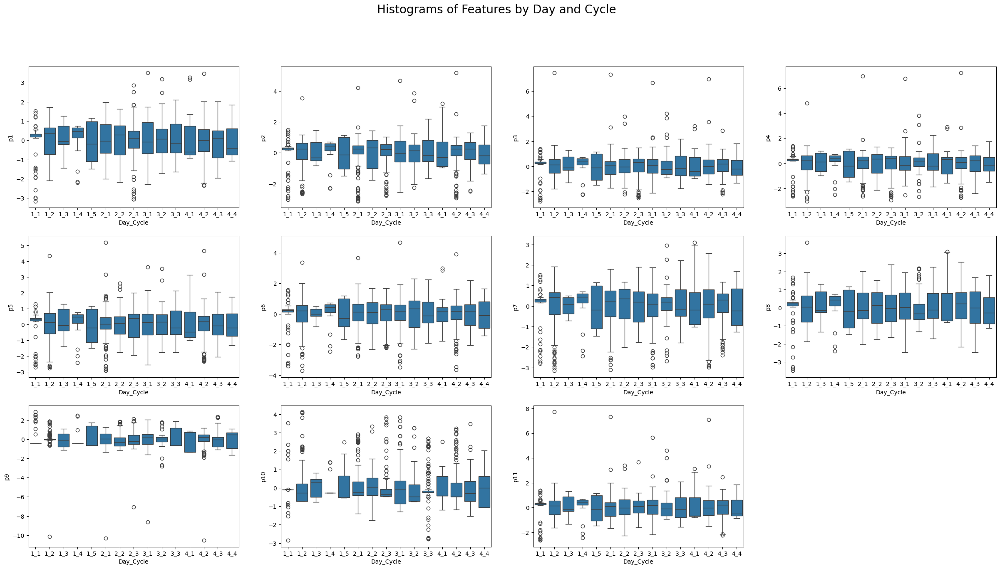

In [93]:
processed_data = data.drop('day_cycle_window', axis=1).groupby(['Day', 'Cycle', 'Window']).mean().reset_index()
processed_data['Day_Cycle'] = processed_data['Day'].astype(str) + '_' + processed_data['Cycle'].astype(str)

plt.figure(figsize=(30, 15))

plt.suptitle('Histograms of Features by Day and Cycle', fontsize=20)    

for i in range(0,11):
    plt.subplot(3, 4, i+1)
    sns.boxplot(data=processed_data, x='Day_Cycle', y=processed_data.columns[i+3])

The boxplots grouped by day and cycle provide a segmented view of the data, which is instrumental in understanding how the parameters' distributions change over time within specific intervals. Each boxplot corresponds to a combination of day and cycle, providing a snapshot of the statistical characteristics for that period.

Here’s an analysis based on the provided boxplots:

- **Variability Within Days and Cycles**: The spread of the data, as indicated by the range of the boxes and whiskers, varies across different days and cycles. This could imply that the system's behavior changes throughout different operational periods.

- **Outliers**: The presence of outliers, shown as individual points outside the whiskers, varies significantly across different day-cycle combinations. Some combinations show a high number of outliers, which could be indicative of anomalous events or changes in system conditions.

- **Shifts in Median**: The central line in each box, representing the median, shifts between day-cycle groups. Consistent shifts could point to cyclical trends, while sporadic shifts might suggest irregular occurrences.

- **Interquartile Range**: The height of the boxes, which reflects the interquartile range (IQR), also changes across the groups. A larger IQR indicates more variability within that day-cycle group, potentially reflecting more complex dynamics or instability.

- **Consistency Across Features**: Some features show consistent boxplot characteristics across day-cycle groups, while others vary more widely. This consistency or lack thereof can inform us about the stability of certain parameters or point to features that are more susceptible to change.

These insights can be used to refine anomaly detection algorithms by accounting for expected variations and focusing on deviations that are abnormal within the context of the time-related grouping. It also allows us to tailor thresholds or anomaly criteria to specific time periods, which can improve the accuracy of anomaly detection.

Text(0.5, 1.0, 'PCA of Features over Days')

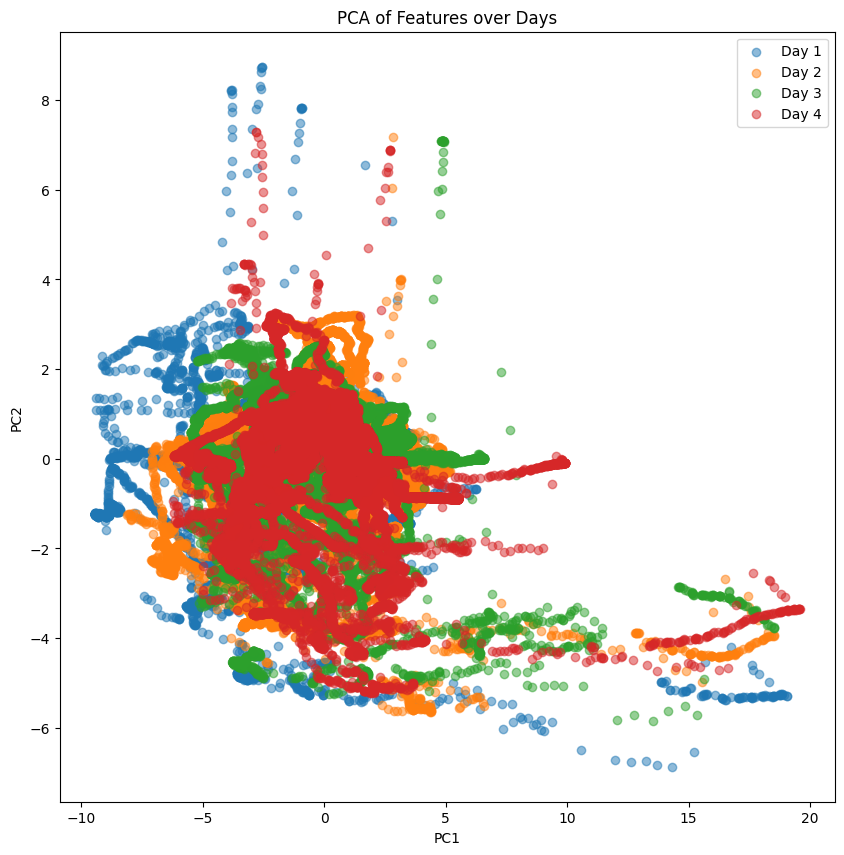

In [94]:
plt.figure(figsize=(10, 10))

for i in range(1,5):
    plt.scatter(data_pca[data['Day'] == i, 0], data_pca[data['Day'] == i, 1], label=f'Day {i}', alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.title('PCA of Features over Days')

The PCA scatter plot of features over different days reveals a distribution of data points across the first two principal components, which are color-coded by day. From the plot, we can observe the following:

1. **Overlap between Days**: There is a significant overlap in the data points from different days, especially in the central cluster. This suggests that the aircraft's operational parameters remain relatively consistent across different days, indicating a stable system.

2. **Outlier Detection**: There are distinct groups of data points (potential outliers) that are far removed from the main cluster, especially along the PC1 axis. These could be indicative of unusual system behavior or specific events that deviate from normal operations and might be anomalies.

3. **Daily Variance**: The spread and direction of data points seem to vary by day, which might reflect daily operational variations or different flight patterns and conditions.

4. **Day-Specific Patterns**: Each day has a unique pattern of spread in the PCA space, which could be related to specific operational modes or environmental conditions that are unique to that day. For instance, 'Day 1' shows a more dispersed pattern compared to the other days, which might suggest more variability in the system's behavior on that day.

5. **Potential for Targeted Analysis**: Given the clustering by day, it might be beneficial to perform a targeted analysis of each cluster to determine if the outliers are consistent across days or if they represent day-specific anomalies.

6. **Investigation of Anomalies**: The points that are distant from the main cluster on all days are prime candidates for anomalies. It's crucial to investigate whether these points represent data errors, system faults, or are indeed normal variations within certain operational parameters.

In the context of anomaly detection in aircraft systems, this visualization can be instrumental in guiding further investigation, helping to pinpoint which operational days require closer scrutiny and potentially aiding in the development of predictive maintenance schedules or flight safety protocols.

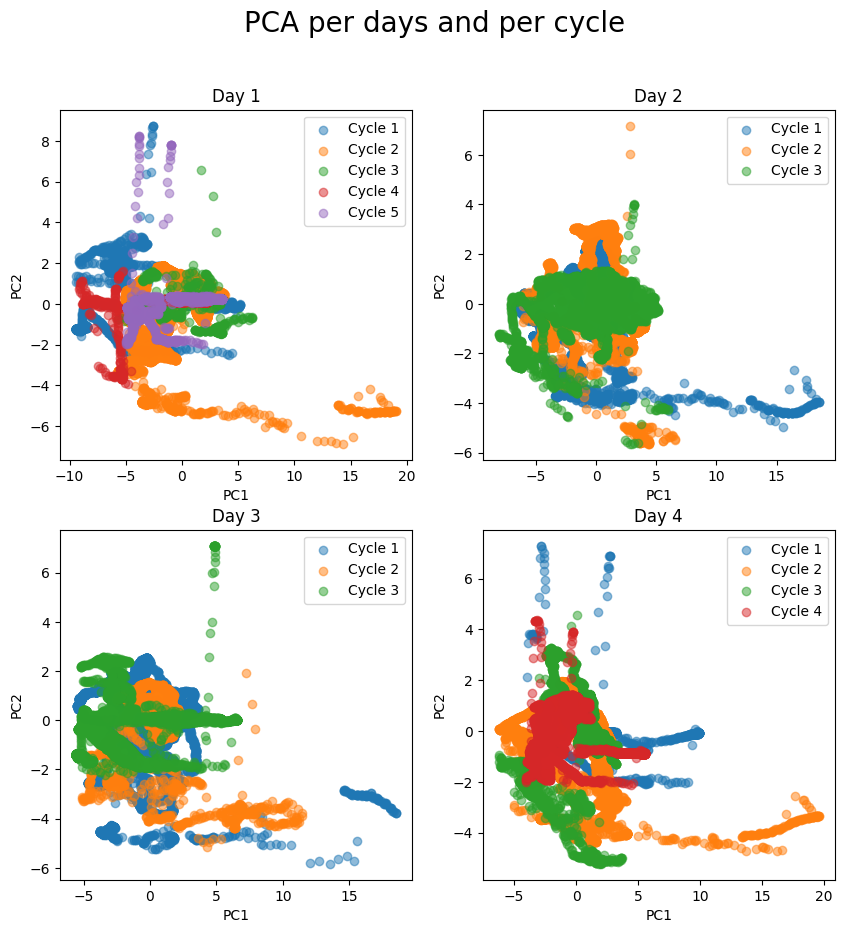

In [95]:
number_of_cycles_per_day = data.drop('day_cycle_window', axis=1).groupby(['Day']).max()['Cycle']

plt.figure(figsize=(10, 10))
plt.suptitle('PCA per days and per cycle', fontsize=20)    

for i in range(1,5):
    plt.subplot(2, 2, i)
    for j in range(1, number_of_cycles_per_day[i] + 1):
        plt.scatter(data_pca[(data['Day'] == i) & (data['Cycle'] == j), 0], data_pca[(data['Day'] == i) & (data['Cycle'] == j), 1], label=f'Cycle {j}', alpha=0.5)
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.legend()
    plt.title(f'Day {i}')

plt.show()

The scatter plots showing PCA analysis per day and per cycle are rich in information for anomaly detection in aircraft systems:

1. **Cycle Variation within Days**: Each plot corresponds to a different day, with colors indicating individual cycles within those days. The variation in the spread of points across cycles can suggest changes in the system's behavior from cycle to cycle. For instance, Day 1 shows a wider spread across cycles compared to other days, indicating more variability.

2. **Daily Patterns**: Comparing plots for each day reveals that the distribution of cycles can vary significantly from one day to another. Days 2 and 3, for example, show a more compact clustering of cycles, whereas Day 1 and Day 4 exhibit more spread, which could be related to different operational patterns or external conditions.

3. **Outliers**: Points that are distant from the main clusters, especially if they are consistent across cycles or days, could represent anomalies. For example, on Day 4, there are several points far along the PC1 axis in Cycle 4 that stand out and should be investigated.

4. **Consistency Across Cycles**: Some cycles show a consistent pattern across different days (like the tight clustering in Cycles 2 and 3 on Days 2 and 3), which might indicate a standard operational mode. Deviations from these patterns could signal anomalies.

5. **Potential Anomalies by Cycle**: Some cycles, such as Cycle 1 on Day 1, have distinct groups of data points that are separated from the main cluster, possibly indicating anomalies that occur in specific operational phases or cycles.

6. **Operational Insights**: The PCA plots can give insights into the operational health of the aircraft systems. For example, if certain cycles consistently show deviations from the norm, it could indicate a recurring issue that requires maintenance or further investigation.

In summary, analyzing PCA scatter plots by day and cycle can help identify patterns and anomalies in the aircraft's operational data. It can allow maintenance teams to pinpoint which days or cycles deviate from the norm, providing an opportunity to perform targeted checks or preventive maintenance, ultimately contributing to flight safety and operational efficiency.

### Conclusion on Data Exploration in the Context of Anomaly Detection

As we conclude the pivotal phase of data exploration in our anomaly detection project, we've achieved a nuanced understanding of our dataset, particularly in the context of aircraft system dynamics. This phase was not merely about scrutinizing data but about laying the groundwork for the sophisticated task of anomaly detection.

#### Key Insights and Findings

1. **Identification of Potential Outliers**: Our exploratory analysis has successfully pinpointed potential outliers. This identification is a critical first step in recognizing what may constitute an anomaly within the complex framework of our dataset.

2. **Understanding Data Distribution**: Assessing the normality and overall distribution of the data has been instrumental. This understanding is key to selecting the most appropriate anomaly detection techniques, as different methods may vary in their effectiveness depending on the underlying data structure.

3. **Insights into Temporal Dynamics**: The exploration has provided us with valuable insights into the temporal aspects of the aircraft system’s data. Recognizing patterns and variations over time is essential, especially when considering the contextual and day-cycle variations in the forthcoming models.

4. **Utilization of PCA for Model Evaluation**: Our discussion on the role of PCA in model evaluation highlights its importance. As we move forward, PCA will serve as a crucial tool not only for visualizing the complexity of our data but also for evaluating the performance of our anomaly detection models.

Armed with these insights, we are now well-equipped to advance to the next phase of our project. This phase involves:
- **Developing Anomaly Detection Models**: We will apply the insights gained from our data exploration to develop models tailored to the unique characteristics of our dataset.
- **Evaluating Model Performance**: Utilizing tools like PCA, we will critically evaluate the performance of these models, ensuring that they accurately detect anomalies while considering the dataset's nuances.

The data exploration phase has been a journey of discovery, revealing the intricacies and challenges of our dataset. As we transition into the model development and evaluation phase, we carry forward a rich understanding of our data, poised to tackle the complex task of anomaly detection with informed strategies and a critical eye towards effective model performance.

## `Modeling`

Following our detailed data exploration, we have identified three distinct methodologies for encapsulating data in the context of anomaly detection:

1. **Point Anomaly Detection**: This method involves assessing each observation within a window independently. We aim to identify anomalies at the level of individual observations. A window is classified as abnormal if it contains at least one anomalous observation. This approach focuses on the specifics of data points, emphasizing the detection of anomalies at a granular level.

2. **Contextual Anomaly Detection**: In contrast to the first method, this approach treats each window as an integrated unit. We analyze the entire window by calculating its mean and standard deviation. A window is deemed abnormal if its overall mean or standard deviation significantly deviates from what is typically observed. This method provides a holistic view, looking for anomalies in the collective behavior of the data within each window.

3. **Contextual Anomaly Detection with Days and Cycles**: Building upon the second approach, this methodology extends the analysis to incorporate variations across different days and cycles. We utilize the mean and standard deviation of the most significant component from the PCA for each window and enrich this with the mean and standard deviation of these components over various days and cycles. An abnormal window in this context is one where the mean or standard deviation is atypical, considering its day-to-day and cycle-to-cycle fluctuations. This approach offers a more comprehensive perspective, taking into account temporal variations in the data to identify anomalies.

Each of these methods offers unique insights into anomaly detection, catering to different aspects of the data and potential anomaly patterns.

### `I. Point Anomaly Detection`

#### Establishing the Foundation for Anomaly Analysis

In our journey towards a comprehensive understanding of anomaly detection within our dataset, we begin with the fundamental approach of **Point Anomaly Detection**. This method serves as the cornerstone of our analytical process, setting the stage for more complex analyses in subsequent stages.

#### Core Concept of Point Anomaly Detection

Point Anomaly Detection is centered around the meticulous examination of individual data points within each observational window. By focusing on each observation independently, this technique aims to uncover singular instances where data points significantly deviate from the established norm. These deviations are what we classify as anomalies.

#### Objective and Methodology

The primary objective of this approach is to identify specific observations that stand out due to their unusual characteristics compared to the majority of the data. These could be sudden spikes in a sensor reading, abrupt dips, or any irregularities that are not in line with the typical pattern of the dataset. 

To implement this, we analyze the data within each window, scrutinizing every observation to flag any that exhibit anomalous behavior. A window is then labeled as abnormal if it contains at least one such outlier observation.

#### Significance in the Anomaly Detection Framework

Point Anomaly Detection is crucial for several reasons:
- **Granularity**: It allows us to capture the minute, often critical, details that might be overlooked in broader analyses.
- **Initial Insights**: As a starting point, it provides valuable insights into the nature of the anomalies, guiding the direction of more comprehensive approaches.
- **Baseline Comparison**: The findings from this method offer a baseline against which we can compare the results from more aggregated anomaly detection techniques.

By starting our analysis with Point Anomaly Detection, we lay a solid foundation for our exploration into the nuances of anomaly detection, ensuring a thorough and meticulous approach to understanding our dataset.

#### Naive Approach univariate approach

The first naive approach would considerer each parameter independantly. To do this we will try two approches the Z-score and the MAD-score in 1D (for each feature). An abnormal observation will be an observation that is abnormal for at least one feature. First we will not focus on the differences between days and cycles. We will considerer the whole dataset as one.

In [113]:
# z score 1D
THRESHOLD = 3.5

from scipy import stats
from sklearn.preprocessing import StandardScaler

processed_data = data.copy()
scaler = StandardScaler()
processed_data = scaler.fit_transform(processed_data.iloc[:, 0:11])

z_scores = pd.DataFrame(stats.zscore(processed_data), columns=data.columns[0:11])

z_scores['anomaly'] = z_scores.apply(lambda x: np.abs(x) > THRESHOLD).sum(axis=1)

windows_abnormal_zscore = data[z_scores['anomaly'] > 0]['day_cycle_window'].unique()
print(f"windows index with anomaly: {windows_abnormal_zscore}")
print(f"number of anomaly: {len(windows_abnormal_zscore)}")
print(f"ratio of anomaly: {len(windows_abnormal_zscore) / len(data['day_cycle_window'].unique())*100} %")

z_scores[z_scores['anomaly'] > 0]


windows index with anomaly: ['1_1_5' '1_1_62' '1_1_63' '1_1_67' '1_1_68' '1_2_1' '1_2_2' '1_2_3'
 '1_2_4' '1_2_5' '1_2_7' '1_2_8' '1_2_32' '1_2_87' '1_2_174' '1_3_4'
 '1_3_5' '1_4_1' '1_4_2' '1_4_3' '1_5_86' '1_5_87' '1_5_93' '2_1_1'
 '2_1_2' '2_1_7' '2_2_54' '2_2_60' '2_2_63' '2_2_64' '2_2_75' '2_2_76'
 '2_3_1' '2_3_2' '2_3_3' '2_3_63' '2_3_109' '2_3_140' '2_3_141' '2_3_142'
 '2_3_143' '2_3_144' '2_3_145' '3_1_1' '3_1_2' '3_1_3' '3_1_7' '3_1_8'
 '3_2_39' '3_2_40' '3_2_45' '3_2_49' '3_2_50' '3_2_51' '3_2_52' '3_3_19'
 '3_3_20' '4_1_17' '4_1_46' '4_1_49' '4_2_1' '4_2_2' '4_2_8' '4_2_9'
 '4_3_50' '4_3_53' '4_3_56' '4_3_58' '4_3_59' '4_3_60' '4_3_61' '4_3_63'
 '4_3_64' '4_4_151' '4_4_160']
number of anomaly: 75
ratio of anomaly: 4.581551618814905 %


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,anomaly
479,-1.102457,-1.037924,-1.216947,-1.704762,-1.384417,-0.498790,-1.158786,-0.867683,0.700902,3.510691,-1.531463,1
480,-1.114628,-1.009425,-1.163194,-1.662233,-1.492594,-0.584204,-1.196269,-0.910876,-0.242359,3.560546,-1.356385,1
481,-1.071183,-0.866892,-1.057203,-1.552081,-1.506356,-0.583812,-1.145639,-0.876522,-0.299004,3.566186,-1.243408,1
482,-0.938506,-0.850894,-0.864156,-1.378270,-1.488662,-0.519075,-1.104516,-0.797380,-0.267384,3.540956,-1.178126,1
483,-0.920686,-0.449034,-0.794436,-1.243233,-1.430456,-0.447220,-0.897421,-0.726470,-0.267384,3.539716,-0.894630,1
...,...,...,...,...,...,...,...,...,...,...,...,...
162667,-0.324616,-0.363568,-0.424457,-0.603236,-0.765632,-0.262764,-0.386127,-0.366783,-1.667406,-5.638378,0.076260,1
162668,-0.324616,-0.363568,-0.419175,-0.603236,-0.765632,-0.253453,-0.381531,-0.366783,-1.667406,-5.638378,0.076260,1
162669,-0.324616,-0.363568,-0.419175,-0.603236,-0.765632,-0.253453,-0.381531,-0.358127,-1.667406,-5.638378,0.076260,1
162670,-0.324616,-0.367299,-0.418562,-0.594418,-0.765632,-0.251948,-0.381531,-0.357374,-1.667406,-5.638378,0.076260,1


The Z-score is a statistical measure that tells us how many standard deviations away a data point is from the mean. More formally, we can define it as:

$$Z = \frac{x - \mu}{\sigma}$$

where $x$ is a data point, $\mu$ is the mean of the feature, and $\sigma$ is the standard deviation of the feature.

The Z-score is a useful metric for detecting outliers, as it allows us to compare data points from different distributions on the same scale. A Z-score of 0 indicates that the data point's value is identical to the mean value of the feature. A Z-score of 1 indicates that the data point is 1 standard deviation away from the mean, and so on. The further away the Z-score is from zero, the more unusual the data point is.

However, the Z-score is sensitive to outliers, as it uses the mean and standard deviation to normalize the data. If the data contains extreme values, the Z-score may not be the best metric to use. It pre-supposes that the data is normally distributed, which is not eactly the case for all the features.

The MAD-score is a statistical measure that tells us how many median absolute deviations away a data point is from the median. More formally, we can define it as:

$$MAD = \frac{|x - \mu|}{\sigma}$$

where $x$ is a data point, $\mu$ is the median of the feature, and $\sigma$ is the median absolute deviation of the feature.

The MAD-score is a useful metric for detecting outliers, as it allows us to compare data points from different distributions on the same scale. A MAD-score of 0 indicates that the data point's value is identical to the median value of the feature. A MAD-score of 1 indicates that the data point is 1 median absolute deviation away from the median, and so on. The further away the MAD-score is from zero, the more unusual the data point is.

The MAD-score is less sensitive to outliers than the Z-score, as it uses the median and median absolute deviation to normalize the data. If the data contains extreme values, the MAD-score may be a better metric to use. It does not pre-suppose that the data is normally distributed, which is not eactly the case for all the features.

About the threshold, nothing is said about the percentage of abnormal observation in the dataset. We will try to find a threshold that will give us around the arbitrary value of 4-5% of abnormal observation in the dataset.

In [114]:
#mad 1D
THRESHOLD = 3.5

from sklearn.preprocessing import StandardScaler

processed_data = data.copy()
scaler = StandardScaler()
processed_data = scaler.fit_transform(processed_data.iloc[:, 0:11])

mad = pd.DataFrame(np.abs(processed_data - np.median(processed_data)), columns=data.columns[0:11])

mad['anomaly'] = mad.apply(lambda x: np.abs(x) > THRESHOLD).sum(axis=1)

windows_abnormal_mad = data[mad['anomaly'] > 0]['day_cycle_window'].unique()
print(f"windows index with anomaly: {windows_abnormal_mad}")
print(f"number of anomaly: {len(windows_abnormal_mad)}")
print(f"ratio of anomaly: {len(windows_abnormal_mad) / len(data['day_cycle_window'].unique())*100} %")

mad[mad['anomaly'] > 0]


windows index with anomaly: ['1_1_1' '1_1_5' '1_1_62' '1_1_63' '1_1_67' '1_1_68' '1_2_1' '1_2_2'
 '1_2_3' '1_2_4' '1_2_5' '1_2_7' '1_2_8' '1_2_32' '1_2_87' '1_2_174'
 '1_3_4' '1_3_5' '1_4_1' '1_4_2' '1_4_3' '1_5_86' '1_5_87' '1_5_93'
 '2_1_1' '2_1_2' '2_1_7' '2_2_54' '2_2_60' '2_2_63' '2_2_64' '2_2_75'
 '2_2_76' '2_3_1' '2_3_2' '2_3_3' '2_3_63' '2_3_109' '2_3_144' '2_3_145'
 '3_1_1' '3_1_2' '3_1_3' '3_1_7' '3_1_8' '3_2_39' '3_2_40' '3_2_45'
 '3_2_49' '3_2_50' '3_2_51' '3_2_52' '3_3_19' '3_3_20' '4_1_46' '4_1_49'
 '4_2_1' '4_2_2' '4_2_8' '4_2_9' '4_3_50' '4_3_53' '4_3_56' '4_3_58'
 '4_3_59' '4_3_60' '4_3_61' '4_3_63' '4_3_64' '4_4_151' '4_4_160']
number of anomaly: 71
ratio of anomaly: 4.337202199144777 %


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,anomaly
22,3.133147,3.242817,3.093805,2.870683,2.555181,3.528543,3.113734,2.682346,3.188815,1.216732,2.932050,1
480,1.148832,1.043629,1.197398,1.696437,1.526798,0.618408,1.230473,0.945080,0.276563,3.526342,1.390589,1
481,1.105387,0.901096,1.091406,1.586285,1.540560,0.618016,1.179843,0.910726,0.333208,3.531982,1.277612,1
482,0.972710,0.885097,0.898360,1.412474,1.522865,0.553279,1.138720,0.831584,0.301588,3.506752,1.212329,1
483,0.954890,0.483238,0.828639,1.277437,1.464660,0.481424,0.931625,0.760674,0.301588,3.505512,0.928834,1
...,...,...,...,...,...,...,...,...,...,...,...,...
162667,0.358820,0.397772,0.458661,0.637440,0.799835,0.296968,0.420330,0.400986,1.701610,5.672582,0.042056,1
162668,0.358820,0.397772,0.453379,0.637440,0.799835,0.287657,0.415735,0.400986,1.701610,5.672582,0.042056,1
162669,0.358820,0.397772,0.453379,0.637440,0.799835,0.287657,0.415735,0.392331,1.701610,5.672582,0.042056,1
162670,0.358820,0.401503,0.452766,0.628622,0.799835,0.286152,0.415735,0.391578,1.701610,5.672582,0.042056,1


In [115]:
#difference between both methods

windows_in_zsore_not_in_mad = [i for i in windows_abnormal_zscore if i not in windows_abnormal_mad]
windows_in_mad_not_in_zscore = [i for i in windows_abnormal_mad if i not in windows_abnormal_zscore]
print(f"windows in zscore not in mad: {windows_in_zsore_not_in_mad}")
print(f"windows in mad not in zscore: {windows_in_mad_not_in_zscore}")


windows in zscore not in mad: ['2_3_140', '2_3_141', '2_3_142', '2_3_143', '4_1_17']
windows in mad not in zscore: ['1_1_1']


It seems like both techniques provide similar results. The MAD-score is less sensitive to outliers than the Z-score, as it uses the median and median absolute deviation to normalize the data. If the data contains extreme values, the MAD-score may be a better metric to use. It does not pre-suppose that the data is normally distributed, which is not eactly the case for all the features.

With this method we processed each feature independantly. In our way of doing it's like we considered that an anomaly is a captor that is not working well, independantly of the others. But in reality, an anomaly is more likely to be a combination of captors that are not working well. As we saw before most of the features are correlated between each other, the anomaly could be the result of a combination of captors that are not giving the right information, or even an uncorrelation between captors that are supposed to be correlated. To take this into account we will try to use a multivariate approach.

#### Multivariate Approach

The multivariate approach will be first, to use the Mahalanobis distance. The Mahalanobis distance is a statistical measure that tells us how many standard deviations away a data point is from the mean of a multivariate distribution. More formally, we can define it as:

$$D_M = \sqrt{(x - \mu)^T \Sigma^{-1} (x - \mu)}$$

where $x$ is a data point, $\mu$ is the mean of the multivariate distribution, and $\Sigma$ is the covariance matrix of the multivariate distribution.

The Mahalanobis distance is a useful metric for detecting outliers, as it allows us to compare data points from different distributions on the same scale. A Mahalanobis distance of 0 indicates that the data point's value is identical to the mean value of the multivariate distribution. A Mahalanobis distance of 1 indicates that the data point is 1 standard deviation away from the mean, and so on. The further away the Mahalanobis distance is from zero, the more unusual the data point is.

The Mahalanobis distance is less sensitive to outliers than the Z-score, as it uses the mean and covariance matrix to normalize the data. If the data contains extreme values, the Mahalanobis distance may be a better metric to use. It does not pre-suppose that the data is normally distributed, which is not eactly the case for all the features.

About the threshold, nothing is said about the percentage of abnormal observation in the dataset. We will try to find a threshold that will give us around the arbitrary value of 4-5% of abnormal observation in the dataset.


In [156]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

def evaluate_model(processed_data, model, scaler=StandardScaler(), pca=PCA(n_components=11)):

    #processed_data = data.groupby(['Day', 'Cycle', 'Window']).mean().reset_index()

    processed_data_scaled = scaler.fit_transform(processed_data.iloc[:, :])
    model.fit(processed_data_scaled)

    processed_data['anomaly'] = model.predict(processed_data_scaled)

    print(f"number of anomaly: {len(processed_data[processed_data['anomaly'] == -1])}")
    print(f"number of normal: {len(processed_data[processed_data['anomaly'] == 1])}")
    print(f"ratio of anomaly: {len(processed_data[processed_data['anomaly'] == -1]) / len(processed_data)}")
    print(f"index of anomaly: {processed_data[processed_data['anomaly'] == -1].index}")

    # Plot with pca
    processed_data_pca = pca.fit_transform(processed_data_scaled)

    print(f"explained variance ratio PCA: {pca.explained_variance_ratio_}")

    plt.figure(figsize=(30, 15))
    plt.scatter(processed_data_pca[:, 0], processed_data_pca[:, 1], c=processed_data['anomaly'], cmap='coolwarm', alpha=0.5, s=100)
    plt.legend(['normal', 'anomaly'])
    plt.title(f"PCA with {model}")
    plt.show()

    return processed_data
    

#### Utilizing PCA for Model Evaluation in Anomaly Detection

`The Role of PCA in Evaluating Anomaly Detection Models`

In the complex and nuanced field of anomaly detection, evaluating the effectiveness of different models is as crucial as the detection process itself. Principal Component Analysis (PCA) emerges not only as a tool for data visualization but also as a strategic ally in the evaluation of anomaly detection models. By transforming and simplifying complex datasets, PCA provides a unique lens through which the performance of these models can be assessed and understood.

`Advantages of PCA in Model Evaluation`

1. **Visual Assessment of Model Performance**: PCA reduces the dimensionality of data to two or three principal components, making it possible to visually assess how well different models identify and isolate anomalies.

2. **Comparison of Anomaly Detection Techniques**: By projecting the results of various anomaly detection models onto a PCA-reduced space, we can directly compare their effectiveness in distinguishing outliers from normal data points.

3. **Identification of Model Sensitivities**: PCA visualizations can highlight which areas of the data space models are more sensitive to, revealing their strengths and weaknesses in detecting different types of anomalies.

4. **Simplification for Interpretation**: The complexity of multi-dimensional data can mask the nuances of model performance. PCA simplifies this data, making it easier to interpret and evaluate the results of various anomaly detection models.

`Limitations and Considerations`

1. **Information Loss**: While PCA provides a simplified view, it’s important to remember that this comes with a loss of information. Critical details that affect model performance might reside in the discarded dimensions.

2. **Linear Focus**: PCA’s linear approach might not fully represent the performance of models that are sensitive to non-linear relationships in the data.

3. **Scale Sensitivity**: The influence of feature scaling on PCA means that the way data is preprocessed can significantly impact how model performance is visualized and evaluated.

4. **Need for Complementary Methods**: Relying solely on PCA for model evaluation can be limiting. It's often beneficial to complement PCA with other evaluation techniques to gain a more holistic view of model performance.

Incorporating PCA into the evaluation process of anomaly detection models offers valuable insights, particularly in visualizing and comparing the efficacy of different models. However, it's essential to be mindful of its limitations and to use it as part of a broader toolkit for a comprehensive evaluation of model performance.

number of anomaly: 1628
number of normal: 161074
ratio of anomaly: 0.010006023281828128
index of anomaly: Index([  6734,   6735,   6736,   6737,   6738,   6739,   6740,   6741,   6742,
         6743,
       ...
       146577, 146578, 146579, 146580, 162665, 162666, 162667, 162668, 162669,
       162670],
      dtype='int64', length=1628)
explained variance ratio PCA: [0.45267103 0.13124085 0.08924381 0.07041576 0.0600024  0.03721626
 0.02974424 0.02765018 0.02574109 0.02099032 0.01522168]


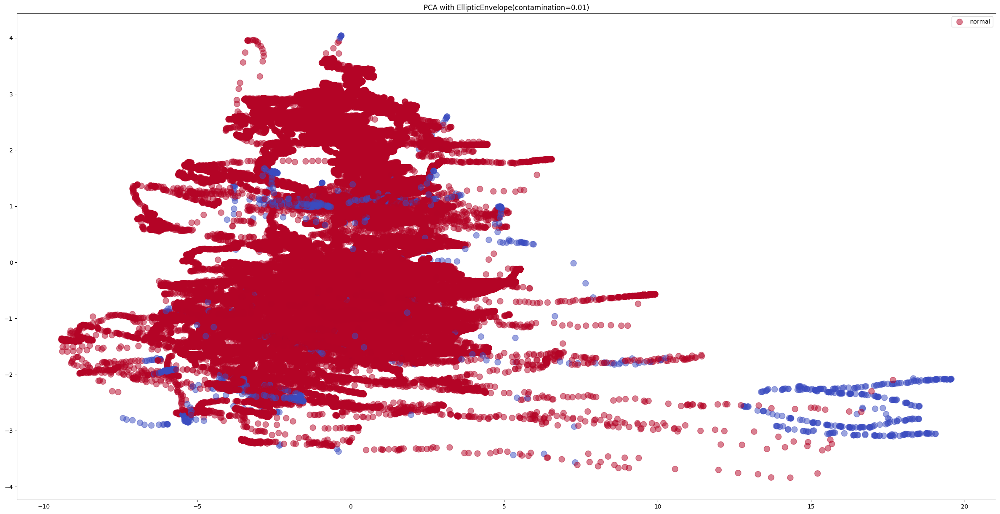

windows index with anomaly: ['1_1_68' '1_2_1' '1_2_2' '1_2_59' '1_2_60' '1_2_61' '1_2_62' '1_2_63'
 '1_3_5' '1_4_1' '1_4_2' '1_4_3' '1_5_86' '1_5_87' '1_5_93' '2_1_1'
 '2_1_2' '2_1_7' '2_2_57' '2_2_60' '2_2_63' '2_2_64' '2_2_75' '2_3_1'
 '2_3_2' '2_3_3' '2_3_5' '2_3_6' '2_3_7' '2_3_8' '2_3_11' '2_3_13'
 '2_3_14' '2_3_15' '2_3_17' '2_3_23' '2_3_27' '2_3_58' '2_3_60' '2_3_63'
 '2_3_91' '2_3_93' '2_3_96' '2_3_115' '2_3_119' '2_3_121' '2_3_133'
 '2_3_135' '2_3_137' '2_3_138' '2_3_144' '2_3_145' '3_1_1' '3_1_2'
 '3_1_105' '3_1_106' '3_2_40' '3_2_45' '3_2_49' '3_2_50' '3_2_51' '3_3_19'
 '3_3_20' '4_1_46' '4_1_49' '4_2_1' '4_2_2' '4_3_53' '4_3_54' '4_3_56'
 '4_3_58' '4_3_59' '4_3_60' '4_3_61' '4_3_63' '4_4_160']
number of anomaly: 76
ratio of anomaly: 4.642638973732438 %


In [118]:
# elliptic envelope

CONTAMINATION = 0.01

from sklearn.covariance import EllipticEnvelope

processed_data = data.copy()

model = EllipticEnvelope(contamination=CONTAMINATION)

processed_data = evaluate_model(processed_data, model)

abnormal_windows = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows}")
print(f"number of anomaly: {len(abnormal_windows)}")
print(f"ratio of anomaly: {len(abnormal_windows) / len(data['day_cycle_window'].unique())*100} %")


In [125]:
abnormal_windows_elliptic = abnormal_windows

difference_with_mad_1d = [i for i in abnormal_windows_elliptic if i not in windows_abnormal_mad]

print(f"difference with mad 1d: {difference_with_mad_1d}")
print(f"number of difference with mad 1d: {len(difference_with_mad_1d)}")


difference with mad 1d: ['1_2_59', '1_2_60', '1_2_61', '1_2_62', '1_2_63', '2_2_57', '2_3_5', '2_3_6', '2_3_7', '2_3_8', '2_3_11', '2_3_13', '2_3_14', '2_3_15', '2_3_17', '2_3_23', '2_3_27', '2_3_58', '2_3_60', '2_3_91', '2_3_93', '2_3_96', '2_3_115', '2_3_119', '2_3_121', '2_3_133', '2_3_135', '2_3_137', '2_3_138', '3_1_105', '3_1_106', '4_3_54']
number of difference with mad 1d: 32


The multivariate approche provided us a different result than the univariate approche. As we defined an anomaly as somthing going not as normal in the plane, it should be the result of a combination of captors that are not giving the right information. This multivariate approche is more relevant than the univariate approche. 

To observe the effect of this method we drew the classified observation on the first two components of the PCA. Even if this representation doesn't give all the information, we can see that some points seem to be abnormal and still beeing classified as normal with this eliptic envelope method. This is due to the fact that the eliptic envelope method is a gaussian method. It means that it will try to fit a gaussian distribution to the data. But as we saw before, the data is not gaussian. This is why we will try to use a non-parametric method.

#### Isolation Forest

The Isolation Forest is an unsupervised learning algorithm for anomaly detection that works on the principle of isolating anomalies, instead of the most common techniques of profiling normal points. It is based on the fact that anomalies are data points that are few and different. As a result of these properties, anomalies are susceptible to a mechanism called isolation.

The Isolation Forest algorithm isolates observations by randomly selecting a feature and then randomly selecting a split value between the maximum and minimum values of the selected feature. The logic argument goes that anomalies are more susceptible to isolation than normal points, and therefore, fewer random partitioning steps are required to isolate them. This isolation process is performed recursively on every subspace formed by this partitioning until all points are isolated.

The Isolation Forest algorithm exploits the fact that anomalies are the minority data points and that they have attribute-values that are very different from those of normal instances. Since trees in the isolation forest algorithm partition the space into smaller regions as they grow deeper, the path length from the root node to the terminating node of an anomaly is expected to be shorter than that of a normal point. Hence, when a forest of random trees collectively produce shorter path lengths for particular samples, they are highly likely to be anomalies.

The Isolation Forest algorithm is highly scalable and can handle large datasets with higher dimensionality. It also has a low linear time complexity and a small memory requirement. It is an algorithm of choice for unsupervised learning tasks that require an algorithm to perform well on an imbalanced dataset.

C:\Users\julie\AppData\Local\Temp\ipykernel_19524\845974744.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  processed_data['anomaly'] = model.predict(processed_data_scaled)


number of anomaly: 3253
number of normal: 159449
ratio of anomaly: 0.019993607945815048
index of anomaly: Index([    11,     12,     13,     14,     15,     16,     17,     18,     19,
           20,
       ...
       146577, 146585, 146586, 146587, 146588, 146589, 146590, 146591, 146592,
       146593],
      dtype='int64', length=3253)
explained variance ratio PCA: [0.45267103 0.13124085 0.08924381 0.07041576 0.0600024  0.03721626
 0.02974424 0.02765018 0.02574109 0.02099032 0.01522168]


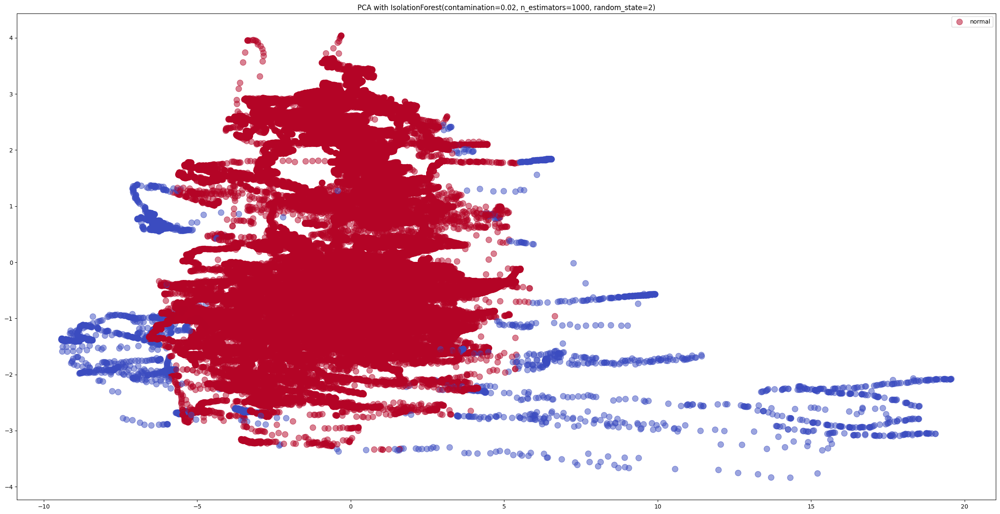

windows index with anomaly: ['1_1_1' '1_1_2' '1_1_3' '1_1_4' '1_1_5' '1_1_62' '1_1_64' '1_1_65'
 '1_1_66' '1_1_67' '1_1_68' '1_2_1' '1_2_2' '1_2_6' '1_2_7' '1_2_8'
 '1_2_9' '1_2_176' '1_3_5' '1_4_1' '1_4_2' '1_4_3' '2_1_1' '2_1_2'
 '2_1_23' '2_2_75' '2_2_76' '2_3_1' '2_3_2' '2_3_3' '2_3_102' '2_3_137'
 '2_3_138' '2_3_139' '2_3_140' '2_3_141' '2_3_142' '2_3_143' '2_3_144'
 '2_3_145' '3_1_1' '3_1_2' '3_1_3' '3_1_4' '3_1_5' '3_1_6' '3_1_7'
 '3_2_49' '3_2_50' '3_2_51' '3_2_52' '3_3_126' '3_3_127' '3_3_128'
 '3_3_129' '4_1_15' '4_1_16' '4_1_17' '4_1_18' '4_2_1' '4_2_2' '4_2_138'
 '4_2_153' '4_2_179' '4_3_53' '4_3_63']
number of anomaly: 66
ratio of anomaly: 4.031765424557117 %


In [193]:
THRESHOLD = 0.02
from sklearn.ensemble import IsolationForest

model = IsolationForest(n_estimators=1000, contamination=THRESHOLD, random_state=2)
processed_data = evaluate_model(data, model)

abnormal_windows_isolation_forest = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_isolation_forest}")
print(f"number of anomaly: {len(abnormal_windows_isolation_forest)}")
print(f"ratio of anomaly: {len(abnormal_windows_isolation_forest) / len(data['day_cycle_window'].unique())*100} %")

In [128]:
difference_with_eliptic_envelope = [i for i in abnormal_windows_isolation_forest if i not in abnormal_windows_elliptic]
print(f"difference with eliptic envelope: {difference_with_eliptic_envelope}")
print(f"number of difference with eliptic envelope: {len(difference_with_eliptic_envelope)}")
print(f"ratio of difference with eliptic envelope: {len(difference_with_eliptic_envelope) / len(abnormal_windows_isolation_forest)*100} %")

difference with eliptic envelope: ['1_1_1', '1_1_2', '1_1_3', '1_1_4', '1_1_5', '1_1_62', '1_1_64', '1_1_65', '1_1_66', '1_1_67', '1_2_7', '1_2_8', '1_2_176', '2_2_76', '2_3_100', '2_3_102', '2_3_139', '2_3_140', '2_3_141', '2_3_142', '2_3_143', '3_1_3', '3_1_4', '3_2_52', '3_3_126', '3_3_127', '3_3_128', '3_3_129', '4_1_15', '4_1_16', '4_1_17', '4_1_18', '4_2_3', '4_2_138', '4_2_153', '4_2_179', '4_2_180']
number of difference with eliptic envelope: 37


With this first non parametric method which is the Isolation Forest, we can see that we found less than half of abnormal windows that we found before with the eliptic envelope method. Hence while these two methods have difference in their way of selection, some of the windows seems to be abnormal according to both methods. Moreover the graph of the PCA with the Isolation Forest method seems to be more relevant than the one with the eliptic envelope method. However, let's keep in mind that this graph is only a representation of the first two components of the PCA. It doesn't give all the information. 

We might want to try other non parametric methods to see if we can find more abnormal windows. and compare the differences between the abnormal windows found by the different methods. We will try to find the threshold that will give us around the arbitrary value of 4-5% of abnormal observation in the dataset to be able to compare with other methods. However let's keep in mind that this threshold is arbitrary and that we might want to change it depending on the context. Especially disccusing with the experts of the field.

#### Local Outlier Factor

The Local Outlier Factor (LOF) algorithm is an unsupervised anomaly detection method which computes the local density deviation of a given data point with respect to its neighbors. It considers as outliers the samples that have a substantially lower density than their neighbors.

The number of neighbors considered, (parameter n_neighbors) is typically chosen 
1) greater than the minimum number of objects a cluster has to contain, so that other objects can be local outliers relative to this cluster, and 
2) smaller than the maximum number of close by objects that can potentially be local outliers.

In practice, such informations are generally not available, and taking n_neighbors=20 appears to work well in general.

C:\Users\julie\AppData\Local\Temp\ipykernel_19524\845974744.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  processed_data['anomaly'] = model.predict(processed_data_scaled)


number of anomaly: 277
number of normal: 162425
ratio of anomaly: 0.0017024990473380782
index of anomaly: Index([   477,    478,    481,    482,    483,    923,    924,    925,   2408,
         2416,
       ...
       159535, 159538, 159539, 159543, 161777, 161784, 161785, 162649, 162650,
       162655],
      dtype='int64', length=277)
explained variance ratio PCA: [0.42438302 0.12304873 0.08373983 0.06602037 0.06247512 0.05618686
 0.03488916 0.02788511 0.02592151 0.02413196 0.01967841]


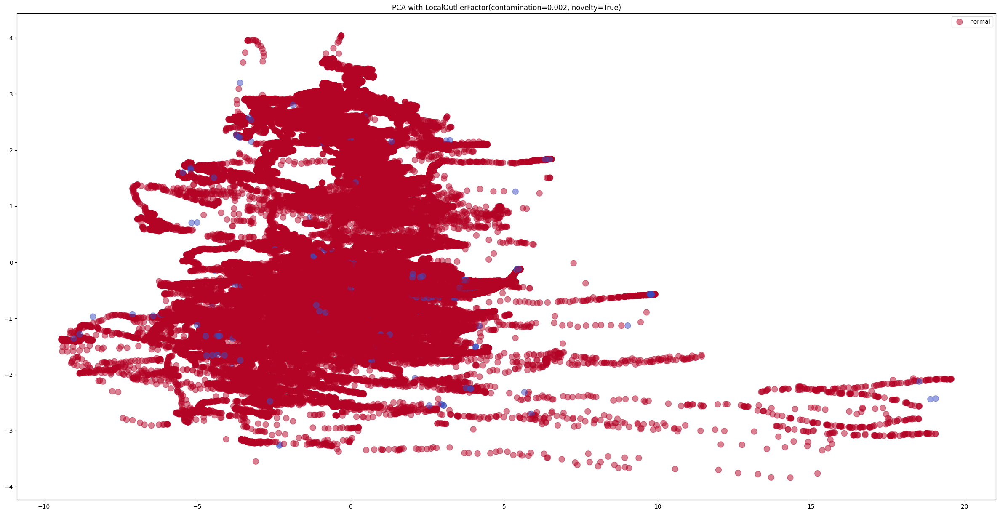

windows index with anomaly: ['1_1_5' '1_1_10' '1_1_25' '1_1_39' '1_1_61' '1_1_62' '1_1_68' '1_2_2'
 '1_2_32' '1_2_173' '1_2_174' '1_3_2' '1_3_4' '1_3_5' '1_5_43' '1_5_64'
 '1_5_87' '1_5_91' '1_5_93' '2_1_2' '2_1_7' '2_1_8' '2_1_81' '2_2_55'
 '2_2_60' '2_3_9' '2_3_27' '2_3_39' '2_3_50' '2_3_85' '2_3_107' '2_3_121'
 '2_3_144' '3_1_6' '3_1_81' '3_2_50' '3_3_2' '3_3_17' '3_3_22' '3_3_41'
 '3_3_46' '3_3_51' '3_3_52' '3_3_57' '3_3_64' '3_3_66' '3_3_128' '3_3_140'
 '3_3_148' '3_3_149' '3_3_163' '4_1_6' '4_1_11' '4_1_15' '4_1_17' '4_1_45'
 '4_1_49' '4_2_1' '4_2_2' '4_2_3' '4_2_15' '4_2_18' '4_2_73' '4_2_74'
 '4_2_138' '4_2_179' '4_3_50' '4_3_56' '4_3_59' '4_4_15' '4_4_29' '4_4_39'
 '4_4_78' '4_4_79' '4_4_100' '4_4_129' '4_4_151' '4_4_160']
number of anomaly: 78
ratio of anomaly: 4.7648136835675015 %


In [161]:
from sklearn.neighbors import LocalOutlierFactor

THRESHOLD = 0.002
NEIGHBORS = 20

model = LocalOutlierFactor(n_neighbors=NEIGHBORS, contamination=THRESHOLD, novelty=True)
processed_data = evaluate_model(data, model)

abnormal_windows_local_outlier_factor = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_local_outlier_factor}")
print(f"number of anomaly: {len(abnormal_windows_local_outlier_factor)}")
print(f"ratio of anomaly: {len(abnormal_windows_local_outlier_factor) / len(data['day_cycle_window'].unique())*100} %")


In [164]:
difference_with_isolation_forest = [i for i in abnormal_windows_local_outlier_factor if i not in abnormal_windows_isolation_forest]
print(f"difference with isolation forest: {difference_with_isolation_forest}")
print(f"number of difference with isolation forest: {len(difference_with_isolation_forest)}")
print(f"percentage of difference with isolation forest: {len(difference_with_isolation_forest) / len(abnormal_windows_isolation_forest)*100} %")

difference_with_eliptic_envelope = [i for i in abnormal_windows_local_outlier_factor if i not in abnormal_windows_elliptic]
print(f"difference with eliptic envelope: {difference_with_eliptic_envelope}")
print(f"number of difference with eliptic envelope: {len(difference_with_eliptic_envelope)}")
print(f"percentage of difference with eliptic envelope: {len(difference_with_eliptic_envelope) / len(abnormal_windows_elliptic)*100} %")

difference with isolation forest: ['1_1_10', '1_1_25', '1_1_39', '1_1_61', '1_2_32', '1_2_173', '1_2_174', '1_3_2', '1_3_4', '1_5_43', '1_5_64', '1_5_87', '1_5_91', '1_5_93', '2_1_7', '2_1_8', '2_1_81', '2_2_55', '2_2_60', '2_3_9', '2_3_27', '2_3_39', '2_3_50', '2_3_85', '2_3_107', '2_3_121', '3_1_6', '3_1_81', '3_3_2', '3_3_17', '3_3_22', '3_3_41', '3_3_46', '3_3_51', '3_3_52', '3_3_57', '3_3_64', '3_3_66', '3_3_140', '3_3_148', '3_3_149', '3_3_163', '4_1_6', '4_1_11', '4_1_45', '4_1_49', '4_2_15', '4_2_18', '4_2_73', '4_2_74', '4_3_50', '4_3_56', '4_3_59', '4_4_15', '4_4_29', '4_4_39', '4_4_78', '4_4_79', '4_4_100', '4_4_129', '4_4_151', '4_4_160']
number of difference with isolation forest: 62
percentage of difference with isolation forest: 100.0 %
difference with eliptic envelope: ['1_1_5', '1_1_10', '1_1_25', '1_1_39', '1_1_61', '1_1_62', '1_2_32', '1_2_173', '1_2_174', '1_3_2', '1_3_4', '1_5_43', '1_5_64', '1_5_91', '2_1_8', '2_1_81', '2_2_55', '2_3_9', '2_3_39', '2_3_50', '2_3_8

The LOF algorithm is a good alternative to the Isolation Forest algorithm when the data has a lower dimensionality. It is also a good choice when the data is not uniformly distributed, as it can handle the varying densities of different regions of the feature space. It is also a good choice when the data is not uniformly distributed, as it can handle the varying densities of different regions of the feature space.

The result on the graph seems to be less relevant than the one with the Isolation Forest method. Moreover, as we saw before the the features are highly correlated between each other. Hence, the LOF method might not be the best method to use in this case. Hence, this redondancy in the data can alter the evaluation of the local density.

As we saw before, the two first principal components of the PCA represent around 74% of the variance. Hence, we can try to use the PCA to reduce the dimensionality of the data and then use the LOF method on the reduced data. This will allow us to reduce the correlation between the features and then to use the LOF method on the reduced data.

#### PCA + LOF

number of anomaly: 285
number of normal: 162417
ratio of anomaly: 0.0017516686949146292
index of anomaly: Index([     4,      6,      7,    490,    491,    547,   2640,   3050,   3051,
         3693,
       ...
       162405, 162406, 162407, 162408, 162409, 162410, 162661, 162662, 162671,
       162672],
      dtype='int64', length=285)
explained variance ratio PCA: [0.36970696 0.33333333]


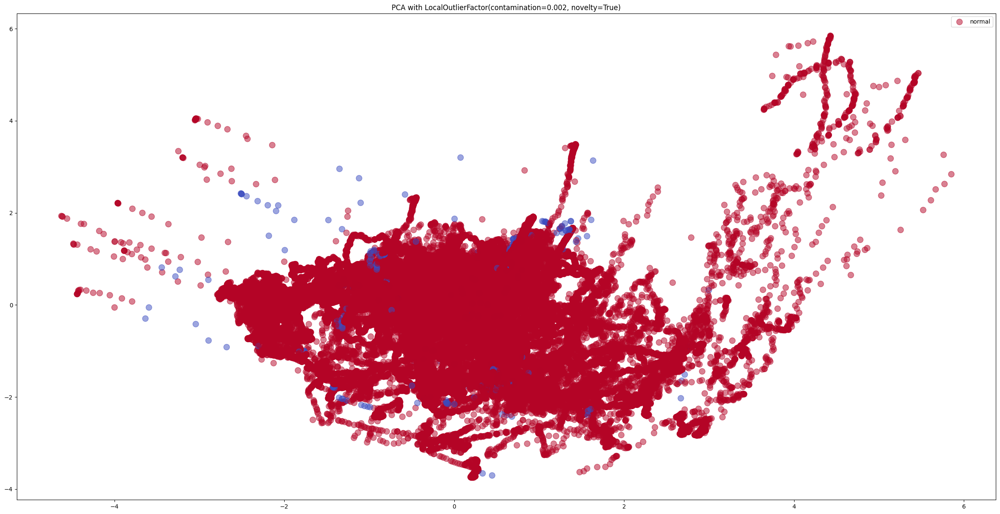

windows index with anomaly: ['1_1_1' '1_1_5' '1_1_6' '1_1_27' '1_1_31' '1_1_37' '1_1_39' '1_1_42'
 '1_1_59' '1_1_61' '1_1_62' '1_1_68' '1_2_7' '1_2_98' '1_2_174' '1_3_2'
 '1_3_3' '1_3_4' '1_3_5' '1_4_3' '1_5_43' '1_5_44' '1_5_76' '1_5_93'
 '2_1_7' '2_1_22' '2_1_49' '2_2_57' '2_3_3' '2_3_5' '2_3_9' '2_3_11'
 '2_3_14' '2_3_18' '2_3_20' '2_3_25' '2_3_39' '2_3_81' '2_3_83' '2_3_84'
 '2_3_96' '2_3_109' '2_3_116' '2_3_119' '2_3_121' '2_3_144' '2_3_145'
 '3_1_14' '3_1_20' '3_1_37' '3_1_134' '3_2_41' '3_2_42' '3_2_44' '3_2_49'
 '3_2_50' '3_3_1' '3_3_19' '3_3_20' '3_3_22' '3_3_46' '3_3_49' '3_3_52'
 '3_3_54' '3_3_125' '3_3_126' '3_3_128' '3_3_129' '3_3_140' '3_3_148'
 '3_3_149' '3_3_150' '4_1_17' '4_1_45' '4_1_46' '4_1_49' '4_2_19' '4_2_91'
 '4_2_95' '4_3_51' '4_3_52' '4_3_59' '4_3_63' '4_4_78' '4_4_79' '4_4_129'
 '4_4_140' '4_4_150' '4_4_151' '4_4_157' '4_4_160']
number of anomaly: 91
ratio of anomaly: 5.558949297495419 %


In [163]:
from sklearn.neighbors import LocalOutlierFactor

THRESHOLD = 0.002
NEIGHBORS = 20

model = LocalOutlierFactor(n_neighbors=NEIGHBORS, contamination=THRESHOLD, novelty=True)
scaler = StandardScaler()
pca = PCA(n_components=2)

processed_data_scaled = scaler.fit_transform(data.iloc[:, 0:11])
processed_data_pca = pca.fit_transform(processed_data_scaled)
processed_data = pd.DataFrame(processed_data_pca, columns=['PC1', 'PC2'])
processed_data['day_cycle_window'] = data['day_cycle_window']
processed_data = evaluate_model(processed_data, model, pca=pca, scaler=scaler)

abnormal_windows_local_outlier_factor_pca = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_local_outlier_factor_pca}")
print(f"number of anomaly: {len(abnormal_windows_local_outlier_factor_pca)}")
print(f"ratio of anomaly: {len(abnormal_windows_local_outlier_factor_pca) / len(data['day_cycle_window'].unique())*100} %")

In [167]:
difference_with_eliptic_envelope = [i for i in abnormal_windows_local_outlier_factor if i not in abnormal_windows_elliptic]
print(f"difference with eliptic envelope: {difference_with_eliptic_envelope}")
print(f"number of difference with eliptic envelope: {len(difference_with_eliptic_envelope)}")
print(f"percentage of difference with eliptic envelope: {len(difference_with_eliptic_envelope) / len(abnormal_windows_local_outlier_factor) * 100} %\n")

difference_with_isolation_forest = [i for i in abnormal_windows_local_outlier_factor if i not in abnormal_windows_isolation_forest]
print(f"difference with isolation forest: {difference_with_isolation_forest}")
print(f"number of difference with isolation forest: {len(difference_with_isolation_forest)}")
print(f"percentage of difference with isolation forest: {len(difference_with_isolation_forest) / len(abnormal_windows_local_outlier_factor) * 100} %\n")

difference_with_local_outlier_factor = [i for i in abnormal_windows_local_outlier_factor if i not in abnormal_windows_local_outlier_factor_pca]
print(f"difference with local outlier factor: {difference_with_local_outlier_factor}")
print(f"number of difference with local outlier factor: {len(difference_with_local_outlier_factor)}")
print(f"percentage of difference with local outlier factor: {len(difference_with_local_outlier_factor) / len(abnormal_windows_local_outlier_factor) * 100} %\n")

difference with eliptic envelope: ['1_1_5', '1_1_10', '1_1_25', '1_1_39', '1_1_61', '1_1_62', '1_2_32', '1_2_173', '1_2_174', '1_3_2', '1_3_4', '1_5_43', '1_5_64', '1_5_91', '2_1_8', '2_1_81', '2_2_55', '2_3_9', '2_3_39', '2_3_50', '2_3_85', '2_3_107', '3_1_6', '3_1_81', '3_3_2', '3_3_17', '3_3_22', '3_3_41', '3_3_46', '3_3_51', '3_3_52', '3_3_57', '3_3_64', '3_3_66', '3_3_128', '3_3_140', '3_3_148', '3_3_149', '3_3_163', '4_1_6', '4_1_11', '4_1_15', '4_1_17', '4_1_45', '4_2_3', '4_2_15', '4_2_18', '4_2_73', '4_2_74', '4_2_138', '4_2_179', '4_3_50', '4_4_15', '4_4_29', '4_4_39', '4_4_78', '4_4_79', '4_4_100', '4_4_129', '4_4_151']
number of difference with eliptic envelope: 60
percentage of difference with eliptic envelope: 76.92307692307693 %

difference with isolation forest: ['1_1_10', '1_1_25', '1_1_39', '1_1_61', '1_2_32', '1_2_173', '1_2_174', '1_3_2', '1_3_4', '1_5_43', '1_5_64', '1_5_87', '1_5_91', '1_5_93', '2_1_7', '2_1_8', '2_1_81', '2_2_55', '2_2_60', '2_3_9', '2_3_27', '2_

With this method using PCA and LOF we don't find any ggod patern regarding the PCA graph. Wr can also notive that the abnormal windows are about 50% different than the ones found with the LOF only meaning that doing this PCA had some effect on the result.

Let's now try other methods. Let's focus on One Class SVM.

#### One Class SVM

One-class SVM is an unsupervised algorithm that learns a decision function for novelty detection: classifying new data as similar or different to the training set.

The algorithm is based on the concept of a hypersphere. The algorithm builds a model capturing the regions where the training data is most likely to be and classifies observations into these regions.


C:\Users\julie\AppData\Local\Temp\ipykernel_19524\845974744.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  processed_data['anomaly'] = model.predict(processed_data_scaled)


number of anomaly: 207
number of normal: 162495
ratio of anomaly: 0.001272264631043257
index of anomaly: Index([    22,     60,     74,     76,    222,    223,    460,   6706,   6727,
         6741,
       ...
       146580, 146583, 161773, 161774, 161776, 161777, 161785, 162650, 162669,
       162670],
      dtype='int64', length=207)
explained variance ratio PCA: [0.42452658 0.12306808 0.08381384 0.06603082 0.0626173  0.05624133
 0.03446532 0.02788457 0.02591944 0.02412155 0.01967839]


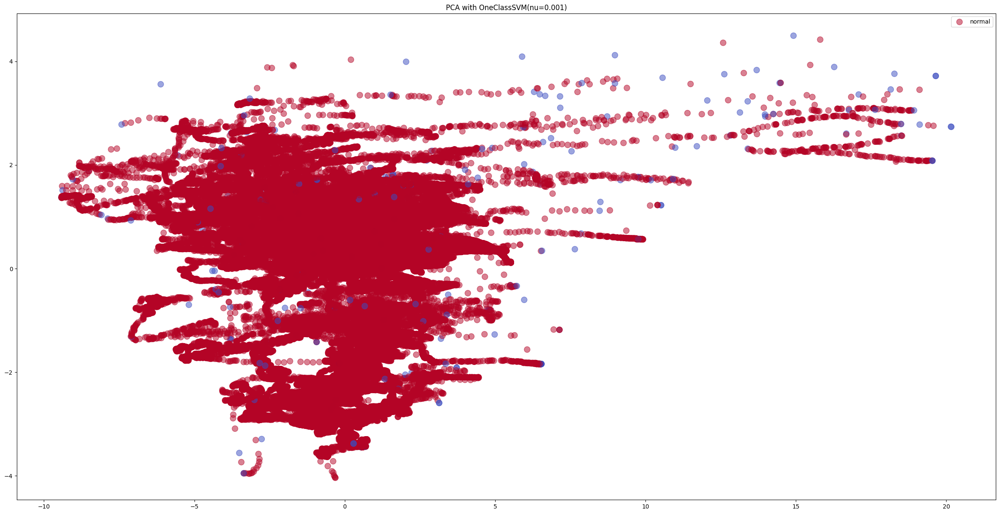

windows index with anomaly: ['1_1_1' '1_1_3' '1_1_5' '1_1_68' '1_2_1' '1_2_2' '1_2_62' '1_2_142'
 '1_2_176' '1_3_2' '1_3_4' '1_3_5' '1_4_1' '1_5_87' '1_5_93' '2_1_1'
 '2_1_2' '2_1_123' '2_2_35' '2_2_37' '2_2_54' '2_2_63' '2_2_64' '2_2_75'
 '2_3_1' '2_3_3' '2_3_6' '2_3_20' '2_3_63' '2_3_64' '2_3_93' '2_3_102'
 '2_3_109' '2_3_138' '2_3_144' '2_3_145' '3_1_1' '3_1_4' '3_1_7' '3_1_13'
 '3_1_117' '3_2_40' '3_2_44' '3_2_45' '3_2_49' '3_2_50' '3_2_51' '3_2_52'
 '3_3_19' '3_3_128' '4_1_17' '4_1_46' '4_1_49' '4_2_1' '4_2_18' '4_2_20'
 '4_2_108' '4_2_130' '4_2_137' '4_2_138' '4_2_172' '4_2_179' '4_3_23'
 '4_3_50' '4_3_53' '4_3_56' '4_3_58' '4_3_59' '4_3_60' '4_3_61' '4_3_63'
 '4_4_151' '4_4_160']
number of anomaly: 73
ratio of anomaly: 4.459376908979841 %


In [175]:
from sklearn.svm import OneClassSVM

THRESHOLD = 0.001
model = OneClassSVM(nu=THRESHOLD)

processed_data = evaluate_model(data, model)

abnormal_windows_one_class_svm = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_one_class_svm}")
print(f"number of anomaly: {len(abnormal_windows_one_class_svm)}")
print(f"ratio of anomaly: {len(abnormal_windows_one_class_svm) / len(data['day_cycle_window'].unique())*100} %")


In [170]:
difference_with_isolation_forest = [i for i in abnormal_windows_one_class_svm if i not in abnormal_windows_isolation_forest]
print(f"difference with isolation forest: {difference_with_isolation_forest}")
print(f"number of difference with isolation forest: {len(difference_with_isolation_forest)}")
print(f"percentage of difference with isolation forest: {len(difference_with_isolation_forest) / len(abnormal_windows_one_class_svm) * 100} %\n")

difference_with_eliptic_envelope = [i for i in abnormal_windows_one_class_svm if i not in abnormal_windows_elliptic]
print(f"difference with eliptic envelope: {difference_with_eliptic_envelope}")
print(f"number of difference with eliptic envelope: {len(difference_with_eliptic_envelope)}")
print(f"percentage of difference with eliptic envelope: {len(difference_with_eliptic_envelope) / len(abnormal_windows_one_class_svm) * 100} %\n")

difference_with_local_outlier_factor = [i for i in abnormal_windows_one_class_svm if i not in abnormal_windows_local_outlier_factor]
print(f"difference with local outlier factor: {difference_with_local_outlier_factor}")
print(f"number of difference with local outlier factor: {len(difference_with_local_outlier_factor)}")
print(f"percentage of difference with local outlier factor: {len(difference_with_local_outlier_factor) / len(abnormal_windows_one_class_svm) * 100} %\n")

difference_with_local_outlier_factor_pca = [i for i in abnormal_windows_one_class_svm if i not in abnormal_windows_local_outlier_factor_pca]
print(f"difference with local outlier factor pca: {difference_with_local_outlier_factor_pca}")
print(f"number of difference with local outlier factor pca: {len(difference_with_local_outlier_factor_pca)}")
print(f"percentage of difference with local outlier factor pca: {len(difference_with_local_outlier_factor_pca) / len(abnormal_windows_one_class_svm) * 100} %\n")


difference with isolation forest: ['1_2_62', '1_2_142', '1_2_173', '1_3_2', '1_3_4', '1_5_43', '1_5_87', '1_5_91', '1_5_93', '2_1_7', '2_1_123', '2_2_35', '2_2_63', '2_2_64', '2_3_20', '2_3_63', '2_3_64', '3_1_6', '3_1_7', '3_1_13', '3_1_117', '3_2_39', '3_2_40', '3_3_19', '4_1_46', '4_1_49', '4_2_18', '4_2_74', '4_2_108', '4_2_130', '4_2_137', '4_2_178', '4_3_20', '4_3_50', '4_3_53', '4_3_56', '4_3_59', '4_3_60', '4_3_61', '4_4_100', '4_4_151', '4_4_160']
number of difference with isolation forest: 42
percentage of difference with isolation forest: 56.75675675675676 %

difference with eliptic envelope: ['1_1_1', '1_1_3', '1_1_5', '1_1_62', '1_1_67', '1_2_7', '1_2_142', '1_2_173', '1_2_176', '1_3_2', '1_3_4', '1_5_43', '1_5_91', '2_1_123', '2_2_35', '2_3_20', '2_3_64', '2_3_102', '3_1_4', '3_1_6', '3_1_7', '3_1_13', '3_1_117', '3_2_39', '3_2_52', '3_3_128', '4_1_17', '4_2_18', '4_2_74', '4_2_108', '4_2_130', '4_2_137', '4_2_138', '4_2_178', '4_2_179', '4_3_20', '4_3_50', '4_4_100', '4_

We again find results that differs from the previous methods. The anomaly shown on the graph with  the PCA seems to less relevant than the one with the Isolation Forest method. Moreover, as we saw before the the features are highly correlated between each other. even if this correlation has a fewer impact on the One Class SVM method than on the LOF method, it still have one, it can be the cause of the less relevant result.

#### Autoencoder

An autoencoder is a type of artificial neural network used to learn efficient data codings in an unsupervised manner. The aim of an autoencoder is to learn a representation (encoding) for a set of data, typically for dimensionality reduction, by training the network to ignore signal “noise”. Along with the reduction side, a reconstructing side is learnt, where the autoencoder tries to generate from the reduced encoding a representation as close as possible to its original input, hence its name.

The autoencoder is a neural network that is trained to attempt to copy its input to its output. Internally, it has a hidden layer $h$ that describes a code used to represent the input. The network may be viewed as consisting of two parts: an encoder function $h=f(x)$ and a decoder that produces a reconstruction $r=g(h)$.

The encoder function $f(x)$ maps the input data into the hidden representation $h$. The decoder function $g(h)$ maps the representation $h$ back to the original space. The autoencoder tries to learn an approximation to the identity function, so as to output $\hat{x}$ that is similar to $x$.

The model is trained by minimizing a loss function $L(x, g(f(x)))$. In other words, the autoencoder tries to learn a function $f$ that is as close as possible to the identity function.


In [172]:
# autoencoder

import torch
import torch.nn as nn
from torch.optim import Adam
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim=32):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, encoding_dim),
            nn.ReLU(True))
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, input_dim),
            nn.Sigmoid())

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

def train_autoencoder(model, data, epochs=50, batch_size=32):
    criterion = nn.MSELoss()
    optimizer = Adam(model.parameters(), lr=1e-3)
    data = torch.tensor(data, dtype=torch.float32)

    for epoch in range(epochs):
        for i in range(0, len(data), batch_size):
            batch = data[i:i + batch_size]
            optimizer.zero_grad()
            outputs = model(batch)
            loss = criterion(outputs, batch)
            loss.backward()
            optimizer.step()

def evaluate_model_autencoder(data, encoding_dim=32):

    processed_data = data.copy()
    scaler = StandardScaler()
    processed_data_scaled = scaler.fit_transform(processed_data.iloc[:, :])

    input_dim = processed_data_scaled.shape[1]
    autoencoder = Autoencoder(input_dim, encoding_dim)
    train_autoencoder(autoencoder, processed_data_scaled)

    processed_data_tensor = torch.tensor(processed_data_scaled, dtype=torch.float)
    processed_data_reconstructed = autoencoder(processed_data_tensor).detach().numpy()
    reconstruction_error = np.mean(np.power(processed_data_scaled - processed_data_reconstructed, 2), axis=1)

    threshold = np.quantile(reconstruction_error, 1 - THRESHOLD)


    processed_data['anomaly'] = reconstruction_error > threshold

    print(f"number of anomaly: {len(processed_data[processed_data['anomaly'] == True])}")
    print(f"number of normal: {len(processed_data[processed_data['anomaly'] == False])}")
    print(f"ratio of anomaly: {len(processed_data[processed_data['anomaly'] == True]) / len(processed_data)}")
    print(f"index of anomaly: {processed_data[processed_data['anomaly'] == True].index}")

    pca = PCA(n_components=11)
    processed_data_pca = pca.fit_transform(processed_data_scaled)

    print(f"explained variance ratio PCA: {pca.explained_variance_ratio_}")

    plt.figure(figsize=(30, 15))
    plt.scatter(processed_data_pca[:, 0], processed_data_pca[:, 1], c=processed_data['anomaly'], cmap='coolwarm', alpha=0.5, s=100)
    plt.legend(['normal', 'anomaly'])
    plt.title(f"PCA with Autoencoder")
    plt.show()

    return processed_data



number of anomaly: 814
number of normal: 161888
ratio of anomaly: 0.005003011640914064
index of anomaly: Index([    18,     19,     20,     21,     22,     23,     24,     25,     56,
           57,
       ...
       146577, 146578, 146579, 156711, 161774, 161777, 161785, 162650, 162669,
       162670],
      dtype='int64', length=814)
explained variance ratio PCA: [0.42452658 0.12306808 0.08381384 0.06603082 0.0626173  0.05624133
 0.03446532 0.02788457 0.02591944 0.02412155 0.01967839]


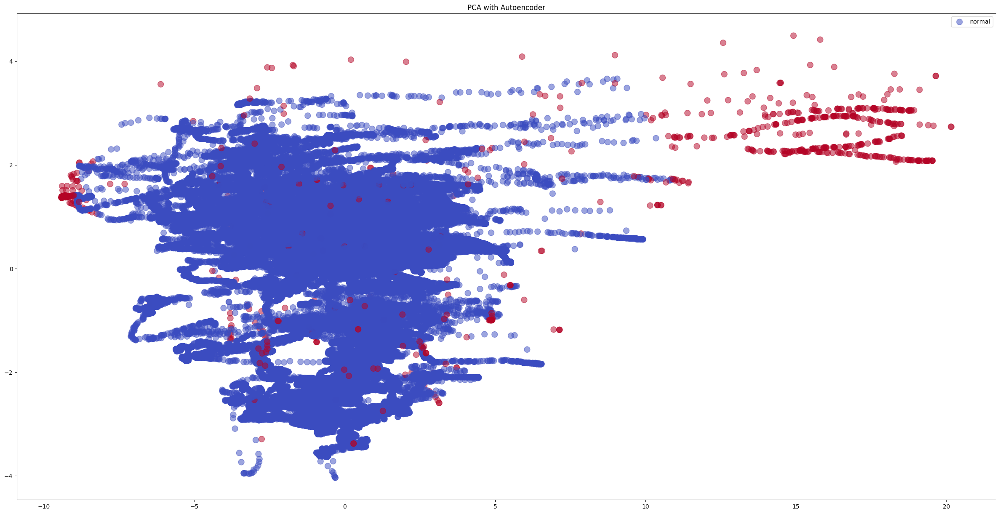

windows index with anomaly: ['1_1_1' '1_1_3' '1_1_5' '1_1_62' '1_1_66' '1_1_67' '1_1_68' '1_2_1'
 '1_2_2' '1_2_7' '1_2_62' '1_2_142' '1_2_173' '1_2_176' '1_3_2' '1_3_4'
 '1_3_5' '1_4_1' '1_5_43' '1_5_86' '1_5_87' '1_5_91' '1_5_93' '2_1_1'
 '2_1_2' '2_1_7' '2_1_123' '2_2_35' '2_2_63' '2_2_64' '2_2_75' '2_3_20'
 '2_3_63' '2_3_64' '2_3_102' '2_3_138' '2_3_144' '2_3_145' '3_1_1' '3_1_4'
 '3_1_6' '3_1_7' '3_1_13' '3_1_117' '3_2_39' '3_2_40' '3_2_49' '3_2_50'
 '3_2_51' '3_2_52' '3_3_19' '3_3_20' '3_3_128' '4_1_17' '4_1_46' '4_1_49'
 '4_2_1' '4_2_2' '4_2_18' '4_2_74' '4_2_108' '4_2_130' '4_2_137' '4_2_138'
 '4_2_178' '4_2_179' '4_3_20' '4_3_50' '4_3_53' '4_3_56' '4_3_59' '4_3_60'
 '4_3_61' '4_3_63' '4_4_100' '4_4_151' '4_4_160']
number of anomaly: 77
ratio of anomaly: 4.703726328649969 %


In [173]:
THRESHOLD = 0.005
processed_data = evaluate_model_autencoder(data, encoding_dim=32)

abnormal_windows_autoencoder = processed_data[processed_data['anomaly'] == True]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_autoencoder}")
print(f"number of anomaly: {len(abnormal_windows_autoencoder)}")
print(f"ratio of anomaly: {len(abnormal_windows_autoencoder) / len(data['day_cycle_window'].unique())*100} %")

In [176]:
difference_with_isolation_forest = [i for i in abnormal_windows_autoencoder if i not in abnormal_windows_isolation_forest]
print(f"difference with isolation forest: {difference_with_isolation_forest}")
print(f"number of difference with isolation forest: {len(difference_with_isolation_forest)}")
print(f"percentage of difference with isolation forest: {len(difference_with_isolation_forest) / len(abnormal_windows_autoencoder) * 100} %\n")

difference_with_eliptic_envelope = [i for i in abnormal_windows_autoencoder if i not in abnormal_windows_elliptic]
print(f"difference with eliptic envelope: {difference_with_eliptic_envelope}")
print(f"number of difference with eliptic envelope: {len(difference_with_eliptic_envelope)}")
print(f"percentage of difference with eliptic envelope: {len(difference_with_eliptic_envelope) / len(abnormal_windows_autoencoder) * 100} %\n")

difference_with_local_outlier_factor = [i for i in abnormal_windows_autoencoder if i not in abnormal_windows_local_outlier_factor]
print(f"difference with local outlier factor: {difference_with_local_outlier_factor}")
print(f"number of difference with local outlier factor: {len(difference_with_local_outlier_factor)}")
print(f"percentage of difference with local outlier factor: {len(difference_with_local_outlier_factor) / len(abnormal_windows_autoencoder) * 100} %\n")

difference_with_local_outlier_factor_pca = [i for i in abnormal_windows_autoencoder if i not in abnormal_windows_local_outlier_factor_pca]
print(f"difference with local outlier factor pca: {difference_with_local_outlier_factor_pca}")
print(f"number of difference with local outlier factor pca: {len(difference_with_local_outlier_factor_pca)}")
print(f"percentage of difference with local outlier factor pca: {len(difference_with_local_outlier_factor_pca) / len(abnormal_windows_autoencoder) * 100} %\n")

difference_with_one_class_svm = [i for i in abnormal_windows_autoencoder if i not in abnormal_windows_one_class_svm]
print(f"difference with one class svm: {difference_with_one_class_svm}")
print(f"number of difference with one class svm: {len(difference_with_one_class_svm)}")
print(f"percentage of difference with one class svm: {len(difference_with_one_class_svm) / len(abnormal_windows_autoencoder) * 100} %\n")



difference with isolation forest: ['1_2_62', '1_2_142', '1_2_173', '1_3_2', '1_3_4', '1_5_43', '1_5_86', '1_5_87', '1_5_91', '1_5_93', '2_1_7', '2_1_123', '2_2_35', '2_2_63', '2_2_64', '2_3_20', '2_3_63', '2_3_64', '3_1_6', '3_1_7', '3_1_13', '3_1_117', '3_2_39', '3_2_40', '3_3_19', '3_3_20', '4_1_46', '4_1_49', '4_2_18', '4_2_74', '4_2_108', '4_2_130', '4_2_137', '4_2_178', '4_3_20', '4_3_50', '4_3_53', '4_3_56', '4_3_59', '4_3_60', '4_3_61', '4_4_100', '4_4_151', '4_4_160']
number of difference with isolation forest: 44
percentage of difference with isolation forest: 57.14285714285714 %

difference with eliptic envelope: ['1_1_1', '1_1_3', '1_1_5', '1_1_62', '1_1_66', '1_1_67', '1_2_7', '1_2_142', '1_2_173', '1_2_176', '1_3_2', '1_3_4', '1_5_43', '1_5_91', '2_1_123', '2_2_35', '2_3_20', '2_3_64', '2_3_102', '3_1_4', '3_1_6', '3_1_7', '3_1_13', '3_1_117', '3_2_39', '3_2_52', '3_3_128', '4_1_17', '4_2_18', '4_2_74', '4_2_108', '4_2_130', '4_2_137', '4_2_138', '4_2_178', '4_2_179', '4_3

The result of the Autoencoder on the PCA graphs shows anomaly on the contour of the scatter point shape as the isolation forest method. The difference between one class SVM and the autoencoder is smaller than the other methods.

### Conclusion on Point Anomaly Detection

#### Overview of Point Anomaly Detection Findings

In our initial approach to anomaly detection, we concentrated on identifying point anomalies within the dataset. This method aimed to pinpoint specific instances where data points deviated significantly from the majority, based on individual observations within each window. We employed various methodologies, including Isolation Forest, Local Outlier Factor (LOF), and One-Class SVM, each offering unique perspectives in anomaly detection.

#### Comparative Analysis of Methodologies

Our analysis revealed that the choice of the most appropriate method depends largely on the nature of the anomalies we aim to detect:
- The **Isolation Forest** method stood out for its effectiveness in identifying anomalies that appear on the periphery of the scatter point shape in the first two components of the PCA. This method seems to excel in isolating anomalies that are distinct in their features from the majority of the data.
- Conversely, if anomalies are more subtly embedded within the main cluster of data points, indicating a correlation with local density, then methods like **LOF** or **One-Class SVM** might be more suitable. These methods are designed to detect anomalies based on their relation to the surrounding data density.

#### Seeking Expert Guidance and Validation

As we seek to refine our approach and validate our findings, we invite expert feedback on several critical aspects:

1. **Method Selection Based on Anomaly Characteristics**: Given the varying strengths of Isolation Forest, LOF, and One-Class SVM, how would you recommend selecting the most appropriate method based on the specific characteristics of anomalies in our dataset?

2. **Percentage of Anomalies in the Dataset**: We have not yet established a definitive threshold for what constitutes an 'anomalous' percentage within our dataset. Based on your expertise, what would be an appropriate threshold to determine the prevalence of anomalies?

3. **Interpretation of PCA Results**: How do you interpret the effectiveness of these methods in the context of our PCA analysis? Does the positioning of anomalies within the scatter plot (either on the contour or within the main cluster) significantly influence the choice of the detection method?

4. **Recommendations for Methodological Improvement**: Are there additional considerations or alternative strategies you would suggest for enhancing the accuracy and relevance of our point anomaly detection approach?

Your insights and expertise are crucial in guiding our analysis, ensuring that our methodology not only aligns with theoretical principles but also holds practical significance in real-world applications. We look forward to your valuable input and guidance to optimize our anomaly detection strategy.



### `II. Contextual Anomaly Detection`

#### Rationale for Methodological Shift

In our initial phase of anomaly detection, we concentrated on examining each observation within individual windows. This method, while detailed, primarily targeted anomalies manifesting as distinct deviations at specific points in time. However, this approach presented certain limitations that prompted us to consider an alternative strategy:

1. **Identification of Overall Trends**: Our initial method might not effectively capture anomalies that emerge as a result of broader trends affecting an entire window, rather than isolated points. Anomalies could be the consequence of gradual or cumulative changes over time, which might be overlooked when focusing solely on individual observations.

2. **Computational Efficiency**: Analyzing each observation separately proved to be computationally intensive. As the scale and complexity of data increase, this approach becomes less feasible, necessitating a more efficient method to process and analyze data.

#### Introduction to Contextual Anomaly Detection

To address these challenges, we shifted our focus to **Contextual Anomaly Detection**. This approach involves analyzing aggregated data across each window, specifically by calculating the mean and standard deviation. Here, an 'abnormal' window is defined as one where these statistical measures significantly deviate from what is observed in the majority of the dataset. This method allows us to:

- Detect broader patterns and trends that might signify anomalies.
- Streamline the computational process, making it more feasible to analyze large datasets.
- Provide a more holistic view of the data, potentially uncovering different types of anomalies that might be missed by point-based analysis.

By transitioning to Contextual Anomaly Detection, we aim to enhance our ability to identify anomalies more comprehensively and efficiently, ensuring that our methods remain adaptable and relevant to the evolving nature of our data.

In [188]:
# Aggregation of data within a window
data_processed_mean = data.drop('day_cycle_window', axis=1).groupby(['Day', 'Cycle', 'Window']).mean().reset_index()
data_processed_std = data.drop('day_cycle_window', axis=1).groupby(['Day', 'Cycle', 'Window']).std().reset_index()

data_processed_contextual = pd.merge(data_processed_mean, data_processed_std, on=['Day', 'Cycle', 'Window'], suffixes=('_mean', '_std'))
data_processed_contextual['day_cycle_window'] = data_processed_contextual['Day'].astype(str) + '_' + data_processed_contextual['Cycle'].astype(str) + '_' + data_processed_contextual['Window'].astype(str)
data_processed_contextual.drop(['Day', 'Cycle', 'Window'], axis=1, inplace=True)
data_processed_contextual

,p1_mean,p2_mean,p3_mean,p4_mean,p5_mean,p6_mean,p7_mean,p8_mean,p9_mean,p10_mean,...,p3_std,p4_std,p5_std,p6_std,p7_std,p8_std,p9_std,p10_std,p11_std,day_cycle_window
0,-1.926141,-2.456284,-2.487394,-2.481230,-2.388674,-1.984092,-2.447148,-1.169837,2.848242,-1.370045,...,0.661250,0.631763,0.688777,0.741959,0.666670,0.771232,0.246201,0.673869,0.724468,1_1_1
1,-1.714067,-2.217161,-2.530537,-2.515985,-2.544961,-1.040076,-2.127244,-0.700150,2.246956,-1.545889,...,0.098959,0.134369,0.135402,0.195759,0.141419,0.192997,0.129858,0.497962,0.262073,1_1_2
2,-1.534357,-1.779994,-1.938747,-1.835152,-2.053982,-0.866705,-1.859002,-0.837695,1.903785,-2.853705,...,0.487650,0.487457,0.407959,0.695209,0.439814,0.632491,0.201271,0.459387,0.474839,1_1_3
3,-1.415197,-1.453962,-1.888438,-2.249327,-2.206560,-0.732366,-2.144090,-0.687389,1.915830,-0.828060,...,0.164919,0.089966,0.058644,0.204180,0.148914,0.204898,0.094375,0.398511,0.107617,1_1_4
4,-0.732715,-0.634379,-0.963247,-1.871178,-2.048933,-0.004074,-1.263891,-0.316854,1.779600,-0.932193,...,0.625880,0.685104,0.612853,0.389407,0.650637,0.315635,1.140236,1.219066,0.803952,1_1_5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1632,-0.956537,-1.347865,-1.277796,-1.489708,-1.259816,-1.174963,-1.174717,-1.033134,0.747000,1.698238,...,0.012211,0.013066,0.005996,0.008640,0.010954,0.006935,0.017411,0.005528,0.011801,4_4_156
1633,-0.984032,-1.350121,-1.296572,-1.473924,-1.277888,-1.056938,-1.176011,-1.036529,0.781643,1.822312,...,0.048495,0.044211,0.054135,0.068079,0.053683,0.045851,0.034159,0.300699,0.060153,4_4_157
1634,-1.006301,-1.363260,-1.319295,-1.484471,-1.289714,-0.896817,-1.177147,-1.040539,0.738953,1.777215,...,0.042391,0.030292,0.030558,0.050051,0.028522,0.024552,0.021379,0.151370,0.040060,4_4_158
1635,-1.013992,-1.368401,-1.323755,-1.506278,-1.304717,-0.843966,-1.187889,-1.057283,0.742485,1.701126,...,0.045251,0.031169,0.026079,0.029954,0.016116,0.018430,0.022804,0.005866,0.034995,4_4_159


#### Isolation Forest


number of anomaly: 66
number of normal: 1571
ratio of anomaly: 0.04031765424557117
index of anomaly: Index([   0,    2,    4,   61,   63,   66,   67,   68,   69,   74,  250,  252,
        253,  255,  256,  366,  367,  373,  609,  610,  621,  623,  624,  682,
        684,  685,  715,  717,  724,  736,  757,  760,  766,  767,  768,  769,
        770,  776,  852,  992,  997,  998,  999, 1000, 1002, 1048, 1051, 1057,
       1129, 1148, 1196, 1198, 1230, 1231, 1232, 1233, 1245, 1248, 1249, 1368,
       1469, 1470, 1472, 1474, 1555, 1636],
      dtype='int64')
explained variance ratio PCA: [0.3563399  0.28716506 0.05797849 0.0433035  0.03525219 0.0327919
 0.02289491 0.01904949 0.01774268 0.01680477 0.01466651]


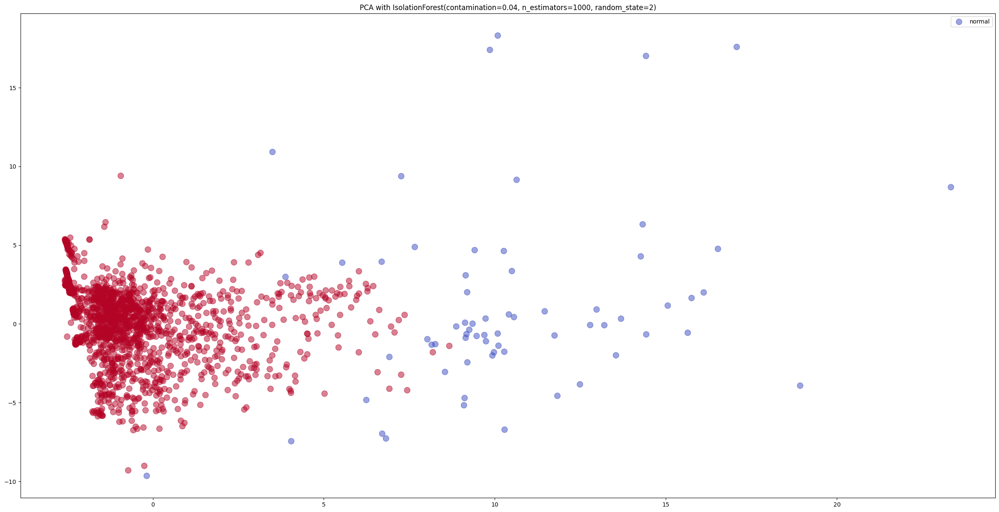

windows index with anomaly: ['1_1_1' '1_1_3' '1_1_5' '1_1_62' '1_1_64' '1_1_67' '1_1_68' '1_2_1'
 '1_2_2' '1_2_7' '1_3_2' '1_3_4' '1_3_5' '1_4_1' '1_4_2' '2_1_1' '2_1_2'
 '2_1_8' '2_2_63' '2_2_64' '2_2_75' '2_3_1' '2_3_2' '2_3_60' '2_3_62'
 '2_3_63' '2_3_93' '2_3_95' '2_3_102' '2_3_114' '2_3_135' '2_3_138'
 '2_3_144' '2_3_145' '3_1_1' '3_1_2' '3_1_3' '3_1_9' '3_1_85' '3_2_44'
 '3_2_49' '3_2_50' '3_2_51' '3_2_52' '3_3_2' '3_3_48' '3_3_51' '3_3_57'
 '3_3_129' '3_3_148' '4_1_15' '4_1_17' '4_1_49' '4_2_1' '4_2_2' '4_2_3'
 '4_2_15' '4_2_18' '4_2_19' '4_2_138' '4_3_58' '4_3_59' '4_3_61' '4_3_63'
 '4_4_79' '4_4_160']
number of anomaly: 66
ratio of anomaly: 4.031765424557117 %


In [200]:
THRESHOLD = 0.04
from sklearn.ensemble import IsolationForest

data_processed_contextual_copy = data_processed_contextual.copy()
model = IsolationForest(n_estimators=1000, contamination=THRESHOLD, random_state=2)

processed_data = evaluate_model(data_processed_contextual_copy, model)

abnormal_windows_isolation_forest_contextual = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_isolation_forest_contextual}")
print(f"number of anomaly: {len(abnormal_windows_isolation_forest_contextual)}")
print(f"ratio of anomaly: {len(abnormal_windows_isolation_forest_contextual) / len(data['day_cycle_window'].unique())*100} %")

In [203]:
difference_with_isolation_forest_contextual = [i for i in abnormal_windows_isolation_forest_contextual if i not in abnormal_windows_isolation_forest]
print(f"difference with isolation forest contextual: {difference_with_isolation_forest_contextual}")
print(f"number of difference with isolation forest contextual: {len(difference_with_isolation_forest_contextual)}")
print(f"percentage of difference with isolation forest contextual: {len(difference_with_isolation_forest_contextual) / len(abnormal_windows_isolation_forest_contextual) * 100} %\n")


difference with isolation forest contextual: ['1_3_2', '1_3_4', '2_1_8', '2_2_63', '2_2_64', '2_3_60', '2_3_62', '2_3_63', '2_3_93', '2_3_95', '2_3_114', '2_3_135', '3_1_9', '3_1_85', '3_2_44', '3_3_2', '3_3_48', '3_3_51', '3_3_57', '3_3_148', '4_1_49', '4_2_3', '4_2_15', '4_2_18', '4_2_19', '4_3_58', '4_3_59', '4_3_61', '4_4_79', '4_4_160']
number of difference with isolation forest contextual: 30
percentage of difference with isolation forest contextual: 45.45454545454545 %



#### One Class SVM

number of anomaly: 64
number of normal: 1573
ratio of anomaly: 0.03909590714722053
index of anomaly: Index([   2,   63,   65,   66,   67,   76,   89,  129,  209,  257,  358,  372,
        374,  550,  581,  582,  583,  609,  622,  623,  624,  625,  644,  682,
        686,  687,  692,  718,  736,  738,  760,  763,  766,  770,  772,  776,
        787,  852,  863,  999, 1000, 1019, 1057, 1126, 1127, 1196, 1197, 1198,
       1227, 1231, 1232, 1245, 1345, 1367, 1368, 1383, 1409, 1433, 1435, 1471,
       1474, 1551, 1552, 1627],
      dtype='int64')
explained variance ratio PCA: [0.3563399  0.28716506 0.05797849 0.0433035  0.03525219 0.0327919
 0.0228949  0.01904962 0.01774291 0.01680489 0.01466656]


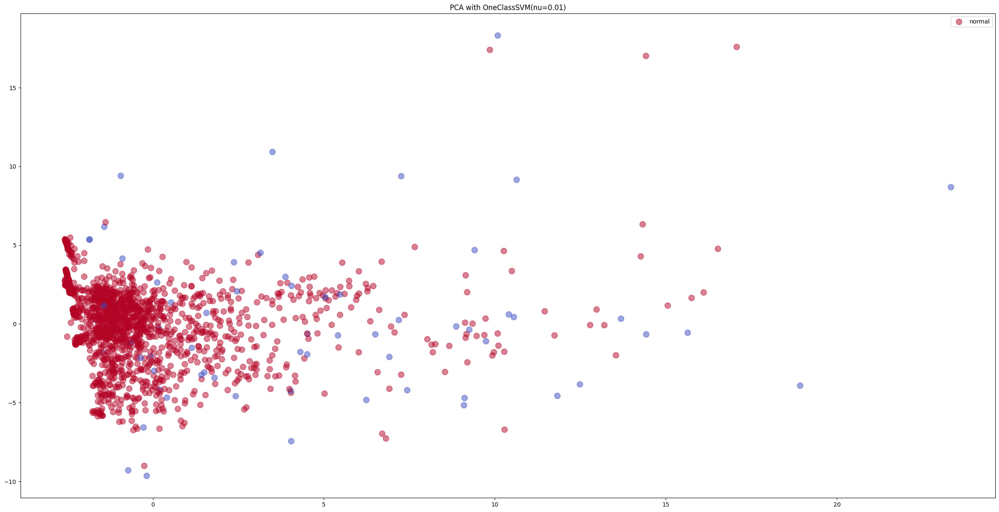

windows index with anomaly: ['1_1_3' '1_1_64' '1_1_66' '1_1_67' '1_1_68' '1_2_9' '1_2_22' '1_2_62'
 '1_2_142' '1_4_3' '1_5_87' '2_1_7' '2_1_9' '2_2_4' '2_2_35' '2_2_36'
 '2_2_37' '2_2_63' '2_2_76' '2_3_1' '2_3_2' '2_3_3' '2_3_22' '2_3_60'
 '2_3_64' '2_3_65' '2_3_70' '2_3_96' '2_3_114' '2_3_116' '2_3_138'
 '2_3_141' '2_3_144' '3_1_3' '3_1_5' '3_1_9' '3_1_20' '3_1_85' '3_1_96'
 '3_2_51' '3_2_52' '3_3_19' '3_3_57' '3_3_126' '3_3_127' '4_1_15' '4_1_16'
 '4_1_17' '4_1_46' '4_2_1' '4_2_2' '4_2_15' '4_2_115' '4_2_137' '4_2_138'
 '4_2_153' '4_2_179' '4_3_22' '4_3_24' '4_3_60' '4_3_63' '4_4_75' '4_4_76'
 '4_4_151']
number of anomaly: 64
ratio of anomaly: 3.9095907147220528 %


In [204]:
THRESHOLD = 0.01
# one class svm

from sklearn.svm import OneClassSVM

data_processed_contextual_copy = data_processed_contextual.copy()
model = OneClassSVM(nu=THRESHOLD)

processed_data = evaluate_model(data_processed_contextual_copy, model)

abnormal_windows_one_class_svm_contextual = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_one_class_svm_contextual}")
print(f"number of anomaly: {len(abnormal_windows_one_class_svm_contextual)}")
print(f"ratio of anomaly: {len(abnormal_windows_one_class_svm_contextual) / len(data['day_cycle_window'].unique())*100} %")

In [206]:
difference_with_svm_not_contextual = [i for i in abnormal_windows_one_class_svm_contextual if i not in abnormal_windows_one_class_svm]
print(f"difference with svm not contextual: {difference_with_svm_not_contextual}")
print(f"number of difference with svm not contextual: {len(difference_with_svm_not_contextual)}")
print(f"percentage of difference with svm not contextual: {len(difference_with_svm_not_contextual) / len(abnormal_windows_one_class_svm_contextual) * 100} %\n")

difference_with_isolation_forest_contextual = [i for i in abnormal_windows_one_class_svm_contextual if i not in abnormal_windows_isolation_forest_contextual]
print(f"difference with isolation forest contextual: {difference_with_isolation_forest_contextual}")
print(f"number of difference with isolation forest contextual: {len(difference_with_isolation_forest_contextual)}")
print(f"percentage of difference with isolation forest contextual: {len(difference_with_isolation_forest_contextual) / len(abnormal_windows_one_class_svm_contextual) * 100} %\n")

difference with svm not contextual: ['1_1_64', '1_1_66', '1_1_67', '1_2_9', '1_2_22', '1_4_3', '2_1_7', '2_1_9', '2_2_4', '2_2_36', '2_2_76', '2_3_2', '2_3_22', '2_3_60', '2_3_65', '2_3_70', '2_3_96', '2_3_114', '2_3_116', '2_3_141', '3_1_3', '3_1_5', '3_1_9', '3_1_20', '3_1_85', '3_1_96', '3_3_57', '3_3_126', '3_3_127', '4_1_15', '4_1_16', '4_2_2', '4_2_15', '4_2_115', '4_2_153', '4_3_22', '4_3_24', '4_4_75', '4_4_76']
number of difference with svm not contextual: 39
percentage of difference with svm not contextual: 60.9375 %

difference with isolation forest contextual: ['1_1_66', '1_2_9', '1_2_22', '1_2_62', '1_2_142', '1_4_3', '1_5_87', '2_1_7', '2_1_9', '2_2_4', '2_2_35', '2_2_36', '2_2_37', '2_2_76', '2_3_3', '2_3_22', '2_3_64', '2_3_65', '2_3_70', '2_3_96', '2_3_116', '2_3_141', '3_1_5', '3_1_20', '3_1_96', '3_3_19', '3_3_126', '3_3_127', '4_1_16', '4_1_46', '4_2_115', '4_2_137', '4_2_153', '4_2_179', '4_3_22', '4_3_24', '4_3_60', '4_4_75', '4_4_76', '4_4_151']
number of differe

#### LOF

number of anomaly: 87
number of normal: 1550
ratio of anomaly: 0.0531459987782529
index of anomaly: Index([   6,    7,    8,   66,   68,  112,  138,  140,  148,  158,  160,  180,
        186,  190,  191,  192,  194,  195,  259,  357,  358,  366,  444,  445,
        514,  546,  554,  555,  567,  749,  764,  765,  768,  779,  831,  848,
        849,  851,  936,  940,  948,  954,  965, 1000, 1019, 1020, 1021, 1059,
       1060, 1061, 1062, 1063, 1065, 1067, 1127, 1128, 1182, 1183, 1184, 1185,
       1186, 1189, 1190, 1191, 1192, 1193, 1197, 1198, 1227, 1231, 1287, 1312,
       1327, 1328, 1331, 1332, 1386, 1387, 1411, 1413, 1419, 1429, 1516, 1551,
       1552, 1580, 1621],
      dtype='int64')
explained variance ratio PCA: [0.3563399  0.28716506 0.05797849 0.0433035  0.03525219 0.0327919
 0.02289491 0.01904962 0.01774303 0.01680501 0.01466662]


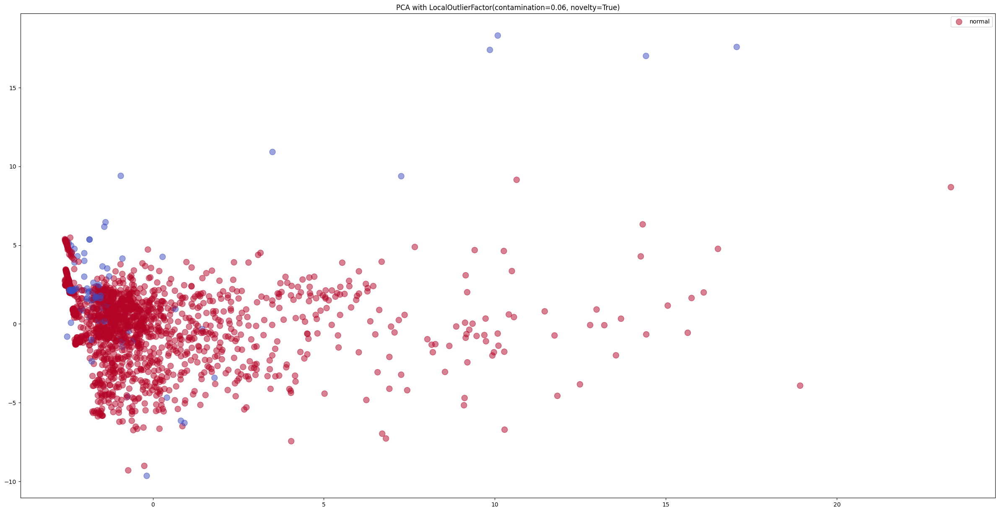

windows index with anomaly: ['1_1_7' '1_1_8' '1_1_9' '1_1_67' '1_2_1' '1_2_45' '1_2_71' '1_2_73'
 '1_2_81' '1_2_91' '1_2_93' '1_2_113' '1_2_119' '1_2_123' '1_2_124'
 '1_2_125' '1_2_127' '1_2_128' '1_4_5' '1_5_86' '1_5_87' '2_1_1' '2_1_79'
 '2_1_80' '2_1_149' '2_1_181' '2_2_8' '2_2_9' '2_2_21' '2_3_127' '2_3_142'
 '2_3_143' '3_1_1' '3_1_12' '3_1_64' '3_1_81' '3_1_82' '3_1_84' '3_1_169'
 '3_1_173' '3_1_181' '3_2_6' '3_2_17' '3_2_52' '3_3_19' '3_3_20' '3_3_21'
 '3_3_59' '3_3_60' '3_3_61' '3_3_62' '3_3_63' '3_3_65' '3_3_67' '3_3_127'
 '3_3_128' '4_1_1' '4_1_2' '4_1_3' '4_1_4' '4_1_5' '4_1_8' '4_1_9'
 '4_1_10' '4_1_11' '4_1_12' '4_1_16' '4_1_17' '4_1_46' '4_2_1' '4_2_57'
 '4_2_82' '4_2_97' '4_2_98' '4_2_101' '4_2_102' '4_2_156' '4_2_157'
 '4_2_181' '4_3_2' '4_3_8' '4_3_18' '4_4_40' '4_4_75' '4_4_76' '4_4_104'
 '4_4_145']
number of anomaly: 87
ratio of anomaly: 5.31459987782529 %


In [211]:
# lof contextual

THRESHOLD = 0.06
NEIGHBORS = 20

from sklearn.neighbors import LocalOutlierFactor

data_processed_contextual_copy = data_processed_contextual.copy()
model = LocalOutlierFactor(n_neighbors=NEIGHBORS, contamination=THRESHOLD, novelty=True)

processed_data = evaluate_model(data_processed_contextual_copy, model)

abnormal_windows_local_outlier_factor_contextual = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_local_outlier_factor_contextual}")
print(f"number of anomaly: {len(abnormal_windows_local_outlier_factor_contextual)}")
print(f"ratio of anomaly: {len(abnormal_windows_local_outlier_factor_contextual) / len(data['day_cycle_window'].unique())*100} %")


In [212]:

difference_with_lof_not_contextual = [i for i in abnormal_windows_local_outlier_factor_contextual if i not in abnormal_windows_local_outlier_factor]
print(f"difference with lof not contextual: {difference_with_lof_not_contextual}")
print(f"number of difference with lof not contextual: {len(difference_with_lof_not_contextual)}")
print(f"percentage of difference with lof not contextual: {len(difference_with_lof_not_contextual) / len(abnormal_windows_local_outlier_factor_contextual) * 100} %\n")

difference_with_isolation_forest_contextual = [i for i in abnormal_windows_local_outlier_factor_contextual if i not in abnormal_windows_isolation_forest_contextual]
print(f"difference with isolation forest contextual: {difference_with_isolation_forest_contextual}")
print(f"number of difference with isolation forest contextual: {len(difference_with_isolation_forest_contextual)}")
print(f"percentage of difference with isolation forest contextual: {len(difference_with_isolation_forest_contextual) / len(abnormal_windows_local_outlier_factor_contextual) * 100} %\n")

difference_with_swm_contextual = [i for i in abnormal_windows_local_outlier_factor_contextual if i not in abnormal_windows_one_class_svm_contextual]
print(f"difference with svm contextual: {difference_with_swm_contextual}")
print(f"number of difference with svm contextual: {len(difference_with_swm_contextual)}")
print(f"percentage of difference with svm contextual: {len(difference_with_swm_contextual) / len(abnormal_windows_local_outlier_factor_contextual) * 100} %\n")

difference with lof not contextual: ['1_1_7', '1_1_8', '1_1_9', '1_1_67', '1_2_1', '1_2_45', '1_2_71', '1_2_73', '1_2_81', '1_2_91', '1_2_93', '1_2_113', '1_2_119', '1_2_123', '1_2_124', '1_2_125', '1_2_127', '1_2_128', '1_4_5', '1_5_86', '2_1_1', '2_1_79', '2_1_80', '2_1_149', '2_1_181', '2_2_8', '2_2_9', '2_2_21', '2_3_127', '2_3_142', '2_3_143', '3_1_1', '3_1_12', '3_1_64', '3_1_82', '3_1_84', '3_1_169', '3_1_173', '3_1_181', '3_2_6', '3_2_17', '3_2_52', '3_3_19', '3_3_20', '3_3_21', '3_3_59', '3_3_60', '3_3_61', '3_3_62', '3_3_63', '3_3_65', '3_3_67', '3_3_127', '4_1_1', '4_1_2', '4_1_3', '4_1_4', '4_1_5', '4_1_8', '4_1_9', '4_1_10', '4_1_12', '4_1_16', '4_1_46', '4_2_57', '4_2_82', '4_2_97', '4_2_98', '4_2_101', '4_2_102', '4_2_156', '4_2_157', '4_2_181', '4_3_2', '4_3_8', '4_3_18', '4_4_40', '4_4_75', '4_4_76', '4_4_104', '4_4_145']
number of difference with lof not contextual: 81
percentage of difference with lof not contextual: 93.10344827586206 %

difference with isolation for

### Conclusion on Contextual Anomaly Detection

#### Contextual Anomaly Detection Methodology

In our exploration of Contextual Anomaly Detection, we shifted our focus from examining individual observations within each window to analyzing overarching trends across entire windows. This approach, leveraging the mean and standard deviation of each window, aimed to identify anomalies based on deviations in these aggregated statistical measures. This method offers a more computationally efficient and holistic view, potentially capturing anomalies that manifest as unusual trends across a window.

#### Preliminary Findings and Method Comparisons

Our initial findings using this aggregated approach have yielded distinct results. Notably, the Isolation Forest method, when compared with LOF and One-Class SVM, showed a significant difference, with 45% of anomalies identified uniquely by this method. Additionally, PCA visualizations suggested that the Isolation Forest was particularly effective at isolating outlier points. 

#### Seeking Expert Validation and Insight

To further refine our approach and validate its effectiveness, we invite expert feedback on several key aspects:

1. **Assessment of Methodologies**: How do you evaluate the performance of the Isolation Forest method in comparison to LOF and One-Class SVM in the context of our dataset? Does the 45% difference in anomaly detection by the Isolation Forest indicate a potential advantage or a limitation of this method?

2. **Interpretation of PCA Visualizations**: Based on our PCA analysis, the Isolation Forest method appeared to isolate outliers more effectively. How would you interpret these results, and what implications might they have for the robustness and accuracy of our approach?

3. **Relevance of Aggregated Data Analysis**: In the context of our dataset, how appropriate is the use of mean and standard deviation for identifying anomalies within windows? Are these measures likely to capture the types of anomalies pertinent to our investigation?

4. **Comparative Analysis with Individual Observation Approach**: Compared to the individual observation analysis, what advantages or potential oversights might this aggregated approach present?

5. **Suggestions for Methodological Enhancement**: Are there modifications or additional statistical measures you would recommend incorporating into our Contextual Anomaly Detection approach to improve its accuracy and applicability?

Your expertise and insights are invaluable in guiding our analysis, ensuring that our methodology is both scientifically robust and practically relevant. We eagerly anticipate your input to enrich our understanding and enhance the effectiveness of our anomaly detection strategy.

### `III. Contextual Anomaly Detection Incorporating Days and Cycles`

#### Advancing Our Analytical Approach

Building on the foundations laid by our Contextual Anomaly Detection strategy, we recognized an opportunity for further refinement to enhance the accuracy and relevance of our anomaly detection efforts. Our previous approach, focusing on the overall statistical trends within each window, provided valuable insights but did not account for the potential influence of temporal factors—specifically, the variations across different days and cycles.

#### Incorporating Temporal Dimensions

To address this, we are evolving our methodology to include an analysis of day-to-day and cycle-to-cycle variations. This progression involves augmenting our dataset with additional features: the mean and standard deviation of each day and cycle. However, mindful of the complexity and potential for data overload, we will limit this enhancement to the two most significant features as determined by our PCA analysis. This strategic choice ensures that we maintain a manageable number of features, avoiding unnecessary complications in our model while still capturing the crucial elements that could influence anomaly detection.

#### Goals of This Enhanced Approach

The primary objectives of this enhanced approach are to:

1. **Capture Temporal Variability**: By including day and cycle information, we aim to detect anomalies that might be related to specific temporal patterns, which could have been previously overlooked.
2. **Refine Anomaly Detection**: This additional layer of analysis is expected to provide a more nuanced view of the data, allowing us to identify anomalies that are not just statistical outliers but also deviations from normal patterns within specific temporal contexts.
3. **Maintain Analytical Efficiency**: By focusing on the most significant features and keeping the feature count low, we strive to balance the depth of analysis with computational efficiency.

Incorporating these temporal elements marks a significant step in our journey towards a more sophisticated and context-aware anomaly detection system, potentially unveiling subtleties in the data that were not apparent in our earlier models.

In [235]:
pca = PCA(n_components=2)
scaler = StandardScaler()

data_copy = data.copy()
data_scaled = scaler.fit_transform(data_copy.iloc[:, 0:11])
data_pca = pca.fit_transform(data_scaled)

data_pca = pd.DataFrame(data_pca, columns=['PC1', 'PC2'])
data_pca = data_pca.merge(data_copy['Day'], left_index=True, right_index=True)
data_pca = data_pca.merge(data_copy['Cycle'], left_index=True, right_index=True)
data_pca = data_pca.merge(data_copy['Window'], left_index=True, right_index=True)

data_group_by_mean = data_pca.groupby(['Day', 'Cycle', 'Window']).mean().reset_index()
data_group_by_std = data_pca.groupby(['Day', 'Cycle', 'Window']).std().reset_index()

data_group_by = pd.merge(data_group_by_mean, data_group_by_std, on=['Day', 'Cycle', 'Window'], suffixes=('_mean', '_std'))


data_mean_cycle = data_group_by.groupby(['Day', 'Cycle']).mean().reset_index()
data_std_cycle = data_group_by.groupby(['Day', 'Cycle']).std().reset_index()

data_group_by_cycle = pd.merge(data_mean_cycle, data_std_cycle, on=['Day', 'Cycle'], suffixes=('_mean_cycle', '_std_cycle'))
data_group_by_cycle = data_group_by_cycle[['Day', 'Cycle', 'PC1_mean_mean_cycle', 'PC2_mean_mean_cycle', 'PC1_mean_std_cycle', 'PC2_mean_std_cycle']]
data_group_by_cycle.rename(columns={'PC1_mean_mean_cycle': 'PC1_mean_cycle', 'PC2_mean_mean_cycle': 'PC2_mean_cycle', 'PC1_mean_std_cycle': 'PC1_std_cycle', 'PC2_mean_std_cycle': 'PC2_std_cycle'}, inplace=True)

data_mean_day = data_group_by_cycle.groupby(['Day']).mean().reset_index()
data_std_day = data_group_by_cycle.groupby(['Day']).std().reset_index()

data_group_by_day = pd.merge(data_mean_day, data_std_day, on=['Day'], suffixes=('_mean_day', '_std_day'))
data_group_by_day = data_group_by_day[['Day', 'PC1_mean_cycle_mean_day', 'PC2_mean_cycle_mean_day', 'PC1_mean_cycle_std_day', 'PC2_mean_cycle_std_day']]
data_group_by_day.rename(columns={'PC1_mean_cycle_mean_day': 'PC1_mean_day', 'PC2_mean_cycle_mean_day': 'PC2_mean_day', 'PC1_mean_cycle_std_day': 'PC1_std_day', 'PC2_mean_cycle_std_day': 'PC2_std_day'}, inplace=True)

data_processed_contextual_day_cycle = data_group_by.merge(data_group_by_day, on=['Day'], suffixes=('_mean', '_std'))
data_processed_contextual_day_cycle = data_processed_contextual_day_cycle.merge(data_group_by_cycle, on=['Day', 'Cycle'], suffixes=('_mean', '_std'))

data_processed_contextual_day_cycle['day_cycle_window'] = data_processed_contextual_day_cycle['Day'].astype(str) + '_' + data_processed_contextual_day_cycle['Cycle'].astype(str) + '_' + data_processed_contextual_day_cycle['Window'].astype(str)
data_processed_contextual_day_cycle.drop(['Day', 'Cycle', 'Window'], axis=1, inplace=True)
data_processed_contextual_day_cycle



,PC1_mean,PC2_mean,PC1_std,PC2_std,PC1_mean_day,PC2_mean_day,PC1_std_day,PC2_std_day,PC1_mean_cycle,PC2_mean_cycle,PC1_std_cycle,PC2_std_cycle,day_cycle_window
0,-7.073665,1.741544,1.602109,0.708448,0.046824,-0.022172,0.090772,0.047589,-0.018252,0.002383,3.043195,0.698991,1_1_1
1,-6.324715,2.184200,0.336650,0.429307,0.046824,-0.022172,0.090772,0.047589,-0.018252,0.002383,3.043195,0.698991,1_1_2
2,-5.041901,2.805102,1.344036,0.320734,0.046824,-0.022172,0.090772,0.047589,-0.018252,0.002383,3.043195,0.698991,1_1_3
3,-5.260284,1.305127,0.315203,0.332286,0.046824,-0.022172,0.090772,0.047589,-0.018252,0.002383,3.043195,0.698991,1_1_4
4,-3.532507,1.414292,1.628284,1.192183,0.046824,-0.022172,0.090772,0.047589,-0.018252,0.002383,3.043195,0.698991,1_1_5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1632,-3.664620,-1.276920,0.027437,0.008823,-0.002667,-0.011567,0.013263,0.020826,-0.002106,-0.000473,2.999925,0.899840,4_4_156
1633,-3.665373,-1.334941,0.133258,0.211048,-0.002667,-0.011567,0.013263,0.020826,-0.002106,-0.000473,2.999925,0.899840,4_4_157
1634,-3.627341,-1.272100,0.092869,0.117749,-0.002667,-0.011567,0.013263,0.020826,-0.002106,-0.000473,2.999925,0.899840,4_4_158
1635,-3.636232,-1.204621,0.087362,0.017413,-0.002667,-0.011567,0.013263,0.020826,-0.002106,-0.000473,2.999925,0.899840,4_4_159


#### Isolation Forest

number of anomaly: 66
number of normal: 1571
ratio of anomaly: 0.04031765424557117
index of anomaly: Index([   0,    2,    4,   61,   67,   68,   69,   74,  249,  250,  251,  252,
        253,  254,  255,  256,  257,  358,  364,  366,  367,  621,  623,  760,
        766,  767,  768,  769,  952,  983,  989,  990,  991,  992,  993,  994,
        997,  998,  999, 1000, 1020, 1048, 1129, 1148, 1198, 1227, 1230, 1231,
       1232, 1245, 1248, 1249, 1409, 1430, 1434, 1464, 1467, 1469, 1470, 1471,
       1472, 1474, 1475, 1476, 1627, 1636],
      dtype='int64')
explained variance ratio PCA: [0.31956572 0.16817712 0.13245251 0.0920539  0.08006889 0.07017672
 0.06228085 0.03022871 0.02156604 0.01356626 0.00524323]


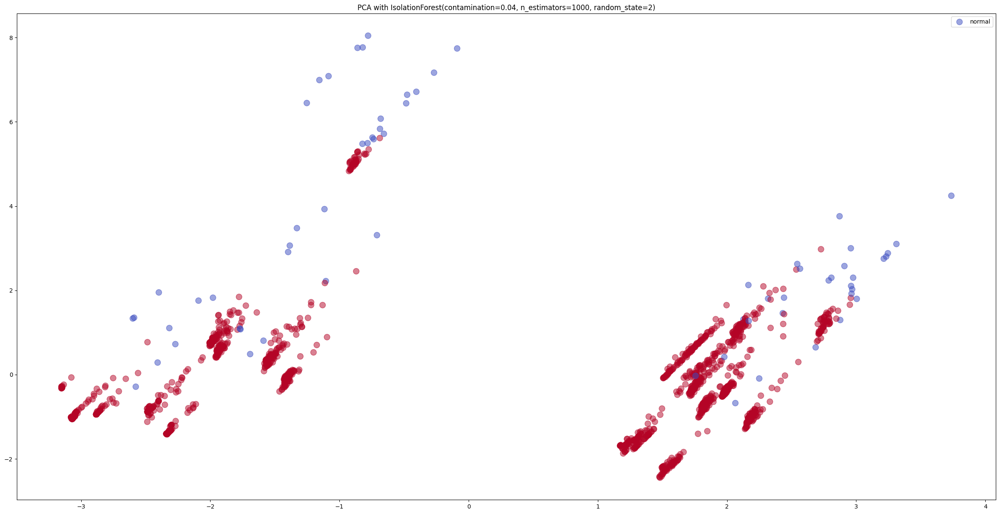

windows index with anomaly: ['1_1_1' '1_1_3' '1_1_5' '1_1_62' '1_1_68' '1_2_1' '1_2_2' '1_2_7' '1_3_1'
 '1_3_2' '1_3_3' '1_3_4' '1_3_5' '1_3_6' '1_4_1' '1_4_2' '1_4_3' '1_5_87'
 '1_5_93' '2_1_1' '2_1_2' '2_2_75' '2_3_1' '2_3_138' '2_3_144' '2_3_145'
 '3_1_1' '3_1_2' '3_2_4' '3_2_35' '3_2_41' '3_2_42' '3_2_43' '3_2_44'
 '3_2_45' '3_2_46' '3_2_49' '3_2_50' '3_2_51' '3_2_52' '3_3_20' '3_3_48'
 '3_3_129' '3_3_148' '4_1_17' '4_1_46' '4_1_49' '4_2_1' '4_2_2' '4_2_15'
 '4_2_18' '4_2_19' '4_2_179' '4_3_19' '4_3_23' '4_3_53' '4_3_56' '4_3_58'
 '4_3_59' '4_3_60' '4_3_61' '4_3_63' '4_3_64' '4_3_65' '4_4_151' '4_4_160']
number of anomaly: 66
ratio of anomaly: 4.031765424557117 %


In [236]:
THRESHOLD = 0.04

from sklearn.ensemble import IsolationForest

data_processed_contextual_day_cycle_copy = data_processed_contextual_day_cycle.copy()
model = IsolationForest(n_estimators=1000, contamination=THRESHOLD, random_state=2)

processed_data = evaluate_model(data_processed_contextual_day_cycle_copy, model)

abnormal_windows_isolation_forest_contextual_day_cycle = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_isolation_forest_contextual_day_cycle}")
print(f"number of anomaly: {len(abnormal_windows_isolation_forest_contextual_day_cycle)}")
print(f"ratio of anomaly: {len(abnormal_windows_isolation_forest_contextual_day_cycle) / len(data['day_cycle_window'].unique())*100} %")

In [237]:
difference_with_isolation_forest_contextual = [i for i in abnormal_windows_isolation_forest_contextual_day_cycle if i not in abnormal_windows_isolation_forest_contextual]
print(f"difference with isolation forest contextual: {difference_with_isolation_forest_contextual}")
print(f"number of difference with isolation forest contextual: {len(difference_with_isolation_forest_contextual)}")
print(f"percentage of difference with isolation forest contextual: {len(difference_with_isolation_forest_contextual) / len(abnormal_windows_isolation_forest_contextual_day_cycle) * 100} %\n")

difference_with_isolation_forest = [i for i in abnormal_windows_isolation_forest_contextual_day_cycle if i not in abnormal_windows_isolation_forest]
print(f"difference with isolation forest: {difference_with_isolation_forest}")
print(f"number of difference with isolation forest: {len(difference_with_isolation_forest)}")
print(f"percentage of difference with isolation forest: {len(difference_with_isolation_forest) / len(abnormal_windows_isolation_forest_contextual_day_cycle) * 100} %\n")

difference with isolation forest contextual: ['1_3_1', '1_3_3', '1_3_6', '1_4_3', '1_5_87', '1_5_93', '3_2_4', '3_2_35', '3_2_41', '3_2_42', '3_2_43', '3_2_45', '3_2_46', '3_3_20', '4_1_46', '4_2_179', '4_3_19', '4_3_23', '4_3_53', '4_3_56', '4_3_60', '4_3_64', '4_3_65', '4_4_151']
number of difference with isolation forest contextual: 24
percentage of difference with isolation forest contextual: 36.36363636363637 %

difference with isolation forest: ['1_3_1', '1_3_2', '1_3_3', '1_3_4', '1_3_6', '1_5_87', '1_5_93', '3_2_4', '3_2_35', '3_2_41', '3_2_42', '3_2_43', '3_2_44', '3_2_45', '3_2_46', '3_3_20', '3_3_48', '3_3_148', '4_1_46', '4_1_49', '4_2_15', '4_2_18', '4_2_19', '4_3_19', '4_3_23', '4_3_56', '4_3_58', '4_3_59', '4_3_60', '4_3_61', '4_3_64', '4_3_65', '4_4_151', '4_4_160']
number of difference with isolation forest: 34
percentage of difference with isolation forest: 51.515151515151516 %



#### One Class SVM

number of anomaly: 84
number of normal: 1553
ratio of anomaly: 0.05131337813072694
index of anomaly: Index([   2,   61,   65,   66,   67,   68,   69,   70,   71,   74,  249,  250,
        252,  253,  254,  255,  256,  257,  269,  270,  271,  357,  358,  364,
        366,  367,  373,  550,  583,  621,  622,  623,  625,  763,  766,  767,
        768,  769,  770,  771,  811,  863,  948,  974,  975,  976,  983,  991,
        992,  995,  998,  999, 1000, 1019, 1020, 1057, 1127, 1128, 1129, 1145,
       1148, 1196, 1197, 1198, 1227, 1230, 1231, 1232, 1245, 1368, 1383, 1409,
       1430, 1432, 1434, 1466, 1469, 1474, 1475, 1587, 1600, 1627, 1632, 1636],
      dtype='int64')
explained variance ratio PCA: [0.31956572 0.16817712 0.13245251 0.0920539  0.08006889 0.07017672
 0.06228085 0.03022871 0.02156604 0.01356626 0.00524323]


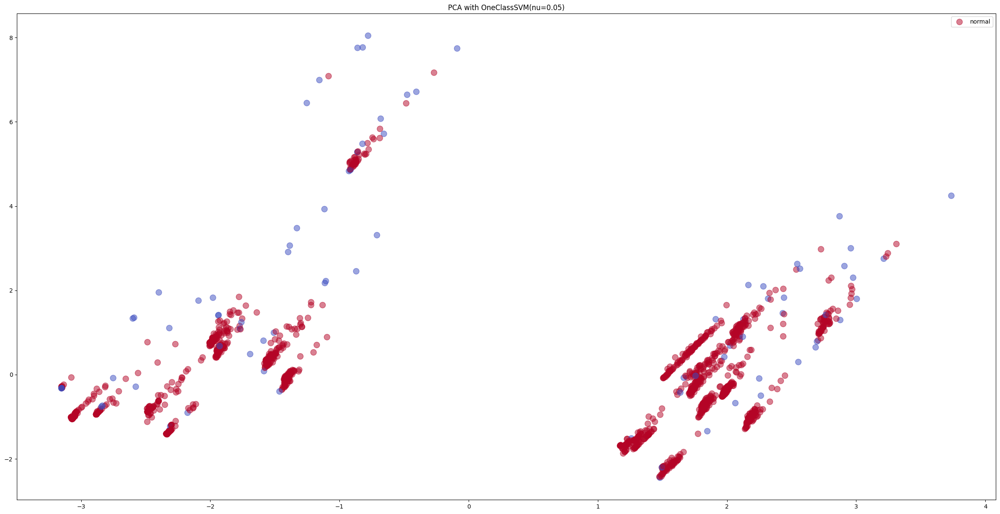

windows index with anomaly: ['1_1_3' '1_1_62' '1_1_66' '1_1_67' '1_1_68' '1_2_1' '1_2_2' '1_2_3'
 '1_2_4' '1_2_7' '1_3_1' '1_3_2' '1_3_4' '1_3_5' '1_3_6' '1_4_1' '1_4_2'
 '1_4_3' '1_4_15' '1_4_16' '1_4_17' '1_5_86' '1_5_87' '1_5_93' '2_1_1'
 '2_1_2' '2_1_8' '2_2_4' '2_2_37' '2_2_75' '2_2_76' '2_3_1' '2_3_3'
 '2_3_141' '2_3_144' '2_3_145' '3_1_1' '3_1_2' '3_1_3' '3_1_4' '3_1_44'
 '3_1_96' '3_1_181' '3_2_26' '3_2_27' '3_2_28' '3_2_35' '3_2_43' '3_2_44'
 '3_2_47' '3_2_50' '3_2_51' '3_2_52' '3_3_19' '3_3_20' '3_3_57' '3_3_127'
 '3_3_128' '3_3_129' '3_3_145' '3_3_148' '4_1_15' '4_1_16' '4_1_17'
 '4_1_46' '4_1_49' '4_2_1' '4_2_2' '4_2_15' '4_2_138' '4_2_153' '4_2_179'
 '4_3_19' '4_3_21' '4_3_23' '4_3_55' '4_3_58' '4_3_63' '4_3_64' '4_4_111'
 '4_4_124' '4_4_151' '4_4_156' '4_4_160']
number of anomaly: 84
ratio of anomaly: 5.131337813072694 %


In [242]:
THRESHOLD = 0.05
# one class svm

from sklearn.svm import OneClassSVM

data_processed_contextual_day_cycle_copy = data_processed_contextual_day_cycle.copy()
model = OneClassSVM(nu=THRESHOLD)

processed_data = evaluate_model(data_processed_contextual_day_cycle_copy, model)

abnormal_windows_one_class_svm_contextual_day_cycle = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_one_class_svm_contextual_day_cycle}")
print(f"number of anomaly: {len(abnormal_windows_one_class_svm_contextual_day_cycle)}")
print(f"ratio of anomaly: {len(abnormal_windows_one_class_svm_contextual_day_cycle) / len(data['day_cycle_window'].unique())*100} %")

In [243]:
difference_with_svm_contextual = [i for i in abnormal_windows_one_class_svm_contextual_day_cycle if i not in abnormal_windows_one_class_svm_contextual]
print(f"difference with svm contextual: {difference_with_svm_contextual}")
print(f"number of difference with svm contextual: {len(difference_with_svm_contextual)}")
print(f"percentage of difference with svm contextual: {len(difference_with_svm_contextual) / len(abnormal_windows_one_class_svm_contextual_day_cycle) * 100} %\n")

difference_with_svm_not_contextual = [i for i in abnormal_windows_one_class_svm_contextual_day_cycle if i not in abnormal_windows_one_class_svm_contextual]
print(f"difference with svm not contextual: {difference_with_svm_not_contextual}")
print(f"number of difference with svm not contextual: {len(difference_with_svm_not_contextual)}")
print(f"percentage of difference with svm not contextual: {len(difference_with_svm_not_contextual) / len(abnormal_windows_one_class_svm_contextual_day_cycle) * 100} %\n")

difference_with_isolation_forest_contextual_day_cycle = [i for i in abnormal_windows_one_class_svm_contextual_day_cycle if i not in abnormal_windows_isolation_forest_contextual_day_cycle]
print(f"difference with isolation forest contextual day cycle: {difference_with_isolation_forest_contextual_day_cycle}")
print(f"number of difference with isolation forest contextual day cycle: {len(difference_with_isolation_forest_contextual_day_cycle)}")
print(f"percentage of difference with isolation forest contextual day cycle: {len(difference_with_isolation_forest_contextual_day_cycle) / len(abnormal_windows_one_class_svm_contextual_day_cycle) * 100} %\n")

difference with svm contextual: ['1_1_62', '1_2_1', '1_2_2', '1_2_3', '1_2_4', '1_2_7', '1_3_1', '1_3_2', '1_3_4', '1_3_5', '1_3_6', '1_4_1', '1_4_2', '1_4_15', '1_4_16', '1_4_17', '1_5_86', '1_5_93', '2_1_1', '2_1_2', '2_1_8', '2_2_75', '2_3_145', '3_1_1', '3_1_2', '3_1_4', '3_1_44', '3_1_181', '3_2_26', '3_2_27', '3_2_28', '3_2_35', '3_2_43', '3_2_44', '3_2_47', '3_2_50', '3_3_20', '3_3_128', '3_3_129', '3_3_145', '3_3_148', '4_1_49', '4_3_19', '4_3_21', '4_3_23', '4_3_55', '4_3_58', '4_3_64', '4_4_111', '4_4_124', '4_4_156', '4_4_160']
number of difference with svm contextual: 52
percentage of difference with svm contextual: 61.904761904761905 %

difference with svm not contextual: ['1_1_62', '1_2_1', '1_2_2', '1_2_3', '1_2_4', '1_2_7', '1_3_1', '1_3_2', '1_3_4', '1_3_5', '1_3_6', '1_4_1', '1_4_2', '1_4_15', '1_4_16', '1_4_17', '1_5_86', '1_5_93', '2_1_1', '2_1_2', '2_1_8', '2_2_75', '2_3_145', '3_1_1', '3_1_2', '3_1_4', '3_1_44', '3_1_181', '3_2_26', '3_2_27', '3_2_28', '3_2_35', '

#### LOF

number of anomaly: 69
number of normal: 1568
ratio of anomaly: 0.042150274893097125
index of anomaly: Index([   5,    6,    7,    8,   10,   11,   29,   48,   60,  249,  254,  261,
        262,  263,  264,  265,  266,  267,  268,  269,  270,  271,  881,  899,
        900, 1000, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012,
       1013, 1014, 1015, 1016, 1018, 1021, 1052, 1058, 1059, 1060, 1061, 1062,
       1063, 1064, 1065, 1066, 1126, 1127, 1128, 1131, 1133, 1134, 1135, 1136,
       1137, 1138, 1139, 1149, 1150, 1197, 1198, 1199, 1231],
      dtype='int64')
explained variance ratio PCA: [0.31956572 0.16817712 0.13245251 0.0920539  0.08006889 0.07017672
 0.06228085 0.03022871 0.02156604 0.01356626 0.00524323]


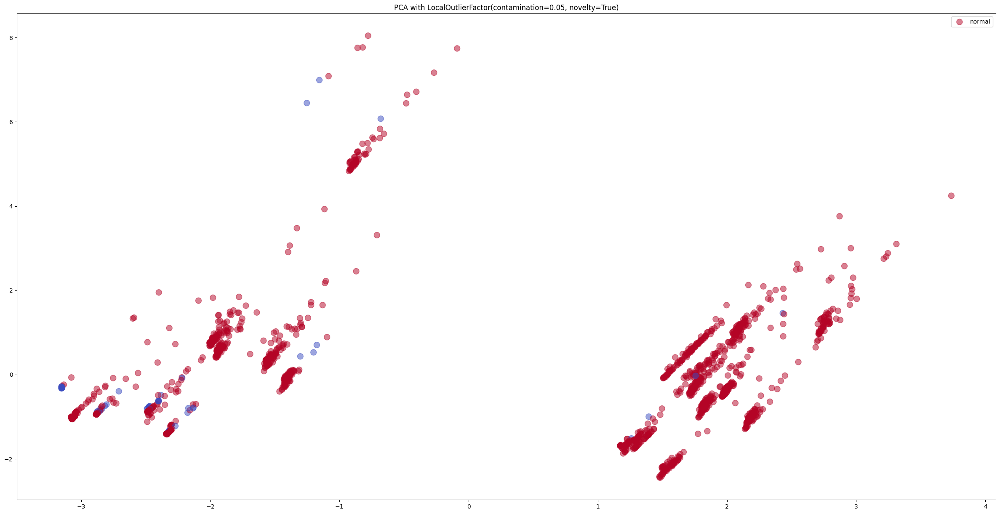

windows index with anomaly: ['1_1_6' '1_1_7' '1_1_8' '1_1_9' '1_1_11' '1_1_12' '1_1_30' '1_1_49'
 '1_1_61' '1_3_1' '1_3_6' '1_4_7' '1_4_8' '1_4_9' '1_4_10' '1_4_11'
 '1_4_12' '1_4_13' '1_4_14' '1_4_15' '1_4_16' '1_4_17' '3_1_114' '3_1_132'
 '3_1_133' '3_2_52' '3_3_3' '3_3_4' '3_3_5' '3_3_6' '3_3_7' '3_3_8'
 '3_3_9' '3_3_10' '3_3_11' '3_3_12' '3_3_13' '3_3_14' '3_3_15' '3_3_16'
 '3_3_18' '3_3_21' '3_3_52' '3_3_58' '3_3_59' '3_3_60' '3_3_61' '3_3_62'
 '3_3_63' '3_3_64' '3_3_65' '3_3_66' '3_3_126' '3_3_127' '3_3_128'
 '3_3_131' '3_3_133' '3_3_134' '3_3_135' '3_3_136' '3_3_137' '3_3_138'
 '3_3_139' '3_3_149' '3_3_150' '4_1_16' '4_1_17' '4_1_18' '4_2_1']
number of anomaly: 69
ratio of anomaly: 4.215027489309713 %


In [245]:
THRESHOLD = 0.05
NEIGHBORS = 20

from sklearn.neighbors import LocalOutlierFactor

data_processed_contextual_day_cycle_copy = data_processed_contextual_day_cycle.copy()
model = LocalOutlierFactor(n_neighbors=NEIGHBORS, contamination=THRESHOLD, novelty=True)

processed_data = evaluate_model(data_processed_contextual_day_cycle_copy, model)

abnormal_windows_local_outlier_factor_contextual_day_cycle = processed_data[processed_data['anomaly'] == -1]['day_cycle_window'].unique()
print(f"windows index with anomaly: {abnormal_windows_local_outlier_factor_contextual_day_cycle}")
print(f"number of anomaly: {len(abnormal_windows_local_outlier_factor_contextual_day_cycle)}")
print(f"ratio of anomaly: {len(abnormal_windows_local_outlier_factor_contextual_day_cycle) / len(data['day_cycle_window'].unique())*100} %")

In [247]:
difference_with_lof_contextual = [i for i in abnormal_windows_local_outlier_factor_contextual_day_cycle if i not in abnormal_windows_local_outlier_factor_contextual]
print(f"difference with lof contextual: {difference_with_lof_contextual}")
print(f"number of difference with lof contextual: {len(difference_with_lof_contextual)}")
print(f"percentage of difference with lof contextual: {len(difference_with_lof_contextual) / len(abnormal_windows_local_outlier_factor_contextual_day_cycle) * 100} %\n")

difference_with_lof_not_contextual = [i for i in abnormal_windows_local_outlier_factor_contextual_day_cycle if i not in abnormal_windows_local_outlier_factor]
print(f"difference with lof not contextual: {difference_with_lof_not_contextual}")
print(f"number of difference with lof not contextual: {len(difference_with_lof_not_contextual)}")
print(f"percentage of difference with lof not contextual: {len(difference_with_lof_not_contextual) / len(abnormal_windows_local_outlier_factor_contextual_day_cycle) * 100} %\n")

difference_with_isolation_forest_contextual_day_cycle = [i for i in abnormal_windows_local_outlier_factor_contextual_day_cycle if i not in abnormal_windows_isolation_forest_contextual_day_cycle]
print(f"difference with isolation forest contextual day cycle: {difference_with_isolation_forest_contextual_day_cycle}")
print(f"number of difference with isolation forest contextual day cycle: {len(difference_with_isolation_forest_contextual_day_cycle)}")
print(f"percentage of difference with isolation forest contextual day cycle: {len(difference_with_isolation_forest_contextual_day_cycle) / len(abnormal_windows_local_outlier_factor_contextual_day_cycle) * 100} %\n")

difference_with_svm_contextual_day_cycle = [i for i in abnormal_windows_local_outlier_factor_contextual_day_cycle if i not in abnormal_windows_one_class_svm_contextual_day_cycle]
print(f"difference with svm contextual day cycle: {difference_with_svm_contextual_day_cycle}")
print(f"number of difference with svm contextual day cycle: {len(difference_with_svm_contextual_day_cycle)}")
print(f"percentage of difference with svm contextual day cycle: {len(difference_with_svm_contextual_day_cycle) / len(abnormal_windows_local_outlier_factor_contextual_day_cycle) * 100} %\n")


difference with lof contextual: ['1_1_6', '1_1_11', '1_1_12', '1_1_30', '1_1_49', '1_1_61', '1_3_1', '1_3_6', '1_4_7', '1_4_8', '1_4_9', '1_4_10', '1_4_11', '1_4_12', '1_4_13', '1_4_14', '1_4_15', '1_4_16', '1_4_17', '3_1_114', '3_1_132', '3_1_133', '3_3_3', '3_3_4', '3_3_5', '3_3_6', '3_3_7', '3_3_8', '3_3_9', '3_3_10', '3_3_11', '3_3_12', '3_3_13', '3_3_14', '3_3_15', '3_3_16', '3_3_18', '3_3_52', '3_3_58', '3_3_64', '3_3_66', '3_3_126', '3_3_131', '3_3_133', '3_3_134', '3_3_135', '3_3_136', '3_3_137', '3_3_138', '3_3_139', '3_3_149', '3_3_150', '4_1_18']
number of difference with lof contextual: 53
percentage of difference with lof contextual: 76.81159420289855 %

difference with lof not contextual: ['1_1_6', '1_1_7', '1_1_8', '1_1_9', '1_1_11', '1_1_12', '1_1_30', '1_1_49', '1_3_1', '1_3_6', '1_4_7', '1_4_8', '1_4_9', '1_4_10', '1_4_11', '1_4_12', '1_4_13', '1_4_14', '1_4_15', '1_4_16', '1_4_17', '3_1_114', '3_1_132', '3_1_133', '3_2_52', '3_3_3', '3_3_4', '3_3_5', '3_3_6', '3_3_7'

#### Conclusion on Contextual Anomaly Detection Incorporating Days and Cycles

In our refined approach, we diligently focused on the intricacies of day-to-day and cycle-to-cycle variations within our dataset. This strategy was grounded in the hypothesis that accounting for these temporal variations would unveil anomalies otherwise masked by routine data fluctuations. 

Through this lens, our analysis took a significant turn, uncovering results distinct from those in previous approaches. The Isolation Forest method, in particular, demonstrated a notable consistency in identifying abnormal windows, aligning well with our earlier findings, despite the added complexity of temporal factors. This consistency not only speaks to the robustness of the Isolation Forest in handling complex data scenarios but also suggests its potential superiority in contexts where temporal variations play a crucial role.

By integrating day and cycle variations, we honed in on anomalies that are seemingly independent of these temporal patterns. This strategic pivot allowed us to detect anomalies that might be concealed by regular operational variances. It signifies an advancement in our anomaly detection capabilities, emphasizing the need to consider temporal elements for a comprehensive analysis.

However, as we navigate through this advanced approach, we seek expert validation and insights to further refine our strategy. We invite experts to ponder and respond to the following queries:

1. **Validation of Hypothesis**: Does the hypothesis that incorporating day and cycle variations will reveal more accurate anomaly detection align with your experience and knowledge in the field?
2. **Choice of Methodology**: Given the distinct results yielded by this approach, how would you assess the choice of the Isolation Forest method compared to other potential strategies?
3. **Impact of Temporal Variations**: In your expert opinion, how do day-to-day and cycle-to-cycle variations typically influence data patterns in similar contexts, and how might this impact anomaly detection?
4. **Comparative Analysis**: Are there alternative methods or techniques that you would recommend for effectively accounting for temporal variations in anomaly detection?
5. **Threshold for Anomalies**: We maintained an anomaly detection threshold at around 4-5% of the dataset. Based on your expertise, is this threshold appropriate for this context, or would you suggest a different criterion?

Your insights and feedback are crucial in ensuring that our anomaly detection framework is not only scientifically robust but also practically relevant and effective in real-world scenarios. We look forward to your invaluable input to enrich our understanding and enhance the efficacy of our approach.


## `Conclusion`

### Summary of Investigation

In this analysis, our primary objective was to identify the most effective method for detecting anomalies within a complex dataset. Our investigation encompassed various approaches and methodologies, each offering unique insights into the anomaly detection process.

### Detailed Analysis of Approaches

1. **Approach Focused on Specific Time Anomalies**:
   - We initially targeted anomalies occurring at specific times, such as sudden spikes in sensor readings. This approach aimed to flag a window as abnormal if it contained significant spikes.
   - Methods including Elliptic Envelope, Isolation Forest, LOF, One-Class SVM, and Autoencoder were employed. The Elliptic Envelope proved less effective due to its bias in non-gaussian distributions.
   - PCA visualization revealed that some potential anomalies were not flagged, leading us to explore non-parametric methods. The Isolation Forest emerged as the most relevant, but this approach was computationally intensive and did not represent the entirety of each window.

2. **Contextual Anomaly Detection Approach**:
   - We then shifted to analyzing entire windows, using mean and standard deviation to identify abnormalities, a method termed as Contextual Anomaly Detection.
   - The application of Isolation Forest, One-Class SVM, and LOF showed that Isolation Forest was again the most relevant, as corroborated by PCA scatter plots.
   - This method shared only 45% similarity in abnormal window identification with the first approach. Its limitation lay in not accounting for day-to-day and cycle-to-cycle variations.

3. **Incorporating Day and Cycle Variations**:
   - To address previous limitations, we integrated day and cycle information, focusing on the two most significant features identified by PCA, thus maintaining a low feature count.
   - Isolation Forest, One-Class SVM, and LOF were re-evaluated, with Isolation Forest maintaining its relevance and One-Class SVM showing promising results.
   - This approach differed from the prior ones, identifying 36% of the same abnormal windows as the second method. It uniquely accounted for variations in days and cycles, targeting anomalies not correlated with these conditions.

### Final Insights and Recommendations

- **Isolation Forest as the Preferred Method**: Across all approaches, the Isolation Forest consistently stood out for its ability to effectively spot anomalies. 
- **Consideration of Computational Efficiency**: Each approach varied in computational demand. The first approach, while detailed, was resource-intensive. Subsequent approaches improved in efficiency and scope.
- **Expert Consultation for Optimal Approach**: The selection of the most suitable method for anomaly detection should be a collaborative decision, involving experts in the field. This collaboration is crucial for validating the practical applicability of our findings.
- **Threshold for Anomalies**: We maintained an anomaly threshold of 4-5% of the dataset. However, this is an arbitrary choice and warrants expert review to ensure it aligns with real-world expectations and requirements.

### Invitation for Expert Review

We invite experts to review our methodology and conclusions. Their insights are invaluable in refining our approach and ensuring that our anomaly detection strategy is both scientifically robust and practically relevant.
